# Making maps from a historical dataset 
## A (geo)pandas notebook approach


### Introduction
Historical GIS has been taking off in the past decade. Historians who need a full-fledged historical geographical research system need a GIS system, but they are complicated and (except for QGIS) also expensive. On the other hand there are now many programmatic libraries for making ad hoc maps, among which geopandas, an extension of the python pandas library.

### Requirements

* A base map of Holland 1812, with the voting cities of Holland in the 18th century. They were:
    Dordrecht, Haarlem, Delft, Leiden, Amsterdam, Gouda, Rotterdam, Gorinchem, Schiedam, Schoonhoven, Den Brielle, Alkmaar, Enkhuizen, Hoorn, Medemblik, Edam, Monnikendam en Purmerend.
 
* The issue is the ditribution of the political societies. There is a spreadsheet with societies (sheet 2_Genootschappen), place names (sheet 1z_Plaatsnamen) and their political color ('gezindheid' in Dutch) (categories on sheet 3_Gezindheid).
    The codes are:
        - patriots (01)
        - oranjegezind (orange) (02)
        - neutraal (13); corresponding exactly to category ‘burgerwapening 1785’ without political color. The few burgerwapeningen 1785 that were patriots belong under 01. We leave it like that for now
        - Bataafs (12)
 
* In addition we are interested in the distribution of the societies that were invited to provincial gatherings or had a representative there. The gatherings are on sheet 4 , the societies that were invited on sheet 5. There are incomplete data with soldiers (Dutch: 'manschappen') and members on sheet 5b.
It may be useful to group the gatherings under ‘1783-1787’ en ‘1794-1795’.

In [2]:
# First initialize all libraries we (may) need
import geopandas as gpd
crs = {'init': 'epsg:4326'} # which seems to be a convenient projection

In [3]:
import geocoder
import pandas as pd
import matplotlib.pyplot as plt
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon
import numpy as np

#### Shapefiles

We need shapefiles for plotting. There are maps from 1812 onwards from the NLgis distributions available from DANS Easy (
Dr. O.W.A. Boonstra; (2007): NLGis shapefiles. DANS. https://doi.org/10.17026/dans-xb9-t677 )
; for shapefiles we might use the api on http://www.nlgis.nl/, but we used the DANS distribution for convenience. 

1812 is a bit later than our period, but it is the best we can get and they are mainly for reference anyway. We converted them on the commandline to geojson files, but leave that out of this notebook

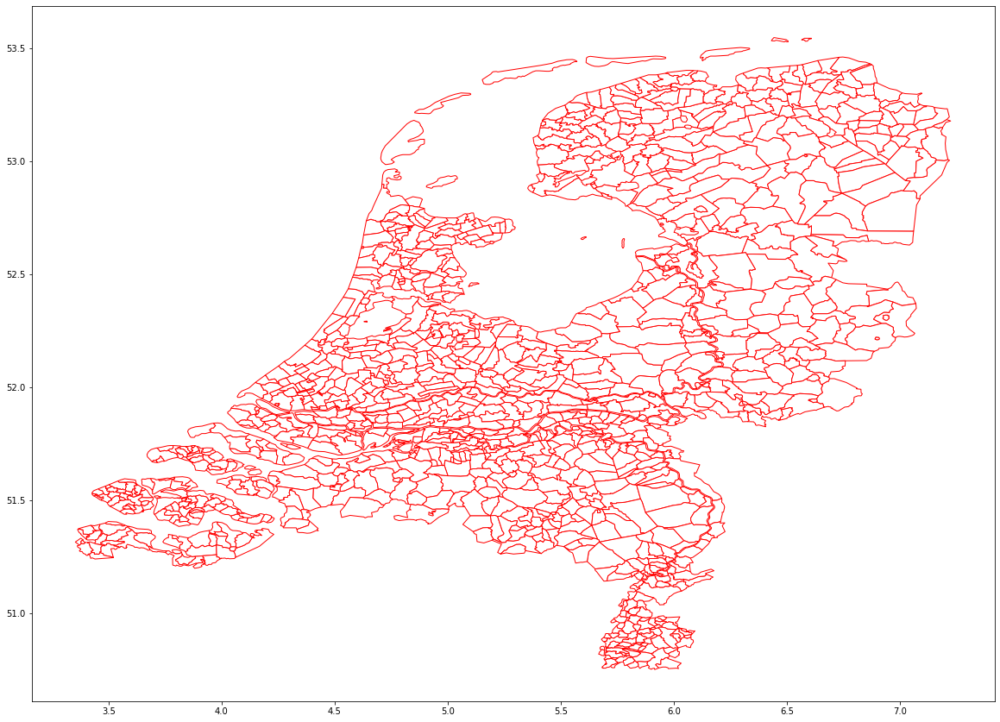

In [4]:
neth = gpd.read_file("/Users/rikhoekstra/develop/geo/municipalities.small.json") # remove references to local files?
#neth.to_crs(crs) # this crashes the interpreter

# and see what the map plot looks like 
fig, ax = plt.subplots(figsize=(20,20))
neth.plot(color="white", edgecolor="red", ax=ax)


  `neth.to_crs(4326) # this crashes the interpreter`

In [5]:
neth.head() # for an idea of the file structure

,GM_1840,GM_NAAM,ID,CBSCODE,ACODE,geometry
0,0088,Schiermonnikoog,3.0,88.0,10355.0,"POLYGON ((6.127 53.444, 6.125 53.45, 6.131 53...."
1,0044,Uithuizermeeden,4.0,44.0,10246.0,"POLYGON ((6.869 53.431, 6.86 53.427, 6.848 53...."
2,0043,Uithuizen,5.0,43.0,11137.0,"POLYGON ((6.732 53.46, 6.692 53.41, 6.703 53.4..."
3,0060,Ameland,6.0,60.0,11153.0,"POLYGON ((5.669 53.419, 5.65 53.42, 5.636 53.4..."
4,0046,Usquert,7.0,46.0,11035.0,"(POLYGON ((6.607 53.384, 6.586 53.376, 6.581 5..."


In [6]:
neth.query("GM_NAAM == 'Medemblik'")

,GM_1840,GM_NAAM,ID,CBSCODE,ACODE,geometry
137,0420,Medemblik,157.0,420.0,11215.0,"POLYGON ((5.12 52.746, 5.122 52.742, 5.11 52.7..."


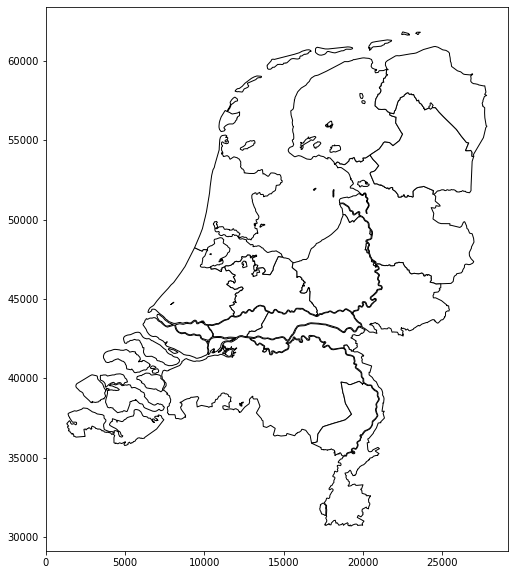

In [7]:
neth_prov = gpd.read_file("/Users/rikhoekstra/develop/geo/provs.json") # provinces, which is ok
#neth.to_crs(crs)

fig, ax = plt.subplots(figsize=(10,10))
neth_prov.plot(color='white', edgecolor='black', ax=ax)

# note that this has a very curious coordinate system; 
# it is not usable for our purposes without further processing, but for reasons of time constraints 
# we refrained from that and sought a work around

In [8]:
neth_prov.crs


{'init': 'epsg:4326'}

In [9]:
neth.crs

{'init': 'epsg:4326'}

In [10]:

npr = gpd.sjoin(neth_prov, neth, how="inner", op='intersects')
npr.crs

{'init': 'epsg:4326'}

In [11]:
unieProv = gpd.overlay(neth, neth_prov, how='union')

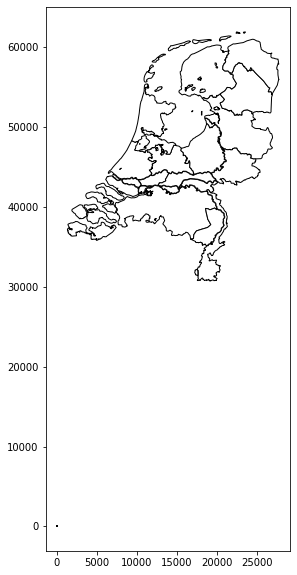

In [12]:
fig, ax = plt.subplots(figsize=(10,10))
unieProv.plot(color="white", edgecolor="black", ax=ax)

# this proves the coordinate mismatch. No further pursuing 

#### The spreadsheet

Read in the data spreadsheet using pandas

In [13]:
df = pd.ExcelFile('/Users/rikhoekstra/Downloads/Copy of Patriotten_datafile_V2 dd 17-6-19.xlsx')


In [14]:
df.sheet_names # for some explanation see introduction

['1_Genootschap',
 '1z_Plaatsnamen',
 '1a_Functionarissen',
 '1b_Afgevaardigden',
 '1c_Andere_betrokkenen',
 '2_Type_Genootschap',
 '3_Gezindheid',
 '4_Bijeenkomsten',
 '5a_Vertegenwoordiging',
 '5b_Manschappen',
 '6_Bronnen',
 'Onderdeel',
 'Tabel Eigen Archief',
 'Archiefbestand',
 'Instelling',
 'burgerbew niet doorgev',
 'ID wijzigingen']

In [15]:
genootschappen = df.parse('1_Genootschap')
genootschappen.head() # for an idea of the file

,ID_Genootschap,ID_Gezindheid,ID_Type_Genootschap,Naam,Zinspreuk,Oprichting,Opheffing,Info_oprichting_e.d.,Legalisatie_door_Staten_van_Holland,Plaats_van_samenkomst,Plaats_van_samenkomst_opmerking,Gelieerd_aan_genootschap_1,Gelieerd_aan_genootschap_2,Gelieerd_aan_genootschap_3,Breder_(institutioneel)_kader
0,GN000017,GZ000001,TG000023,Schutterij van Sint Joris en edele voetboog,NaN,NaN,NaN,Deze bestond al lang.,NaN,NaN,NaN,NaN,NaN,NaN,Het betreft een van de oude schutterijen van D...
1,GN000018,GZ000001,TG000004,Gelegaliseerd exercitiegenootschap,De vrijheid,1783-07-26,NaN,Opgericht 26 juli 1783.,NaN,NaN,NaN,NaN,NaN,NaN,"De Dordtse schutterijen, gilden en neringen en..."
2,GN000019,GZ000001,TG000004,Schutterlijk genootschap (van wapenoefening),"Tot herstel der Delftse schutterij, voor vrijh...",1784-01-12,NaN,Opgericht op 12 januari 1784,NaN,"Aan de Oude Delft, naast het weeshuis.",NaN,NaN,NaN,NaN,Gelieerd aan de Vaderlandse sociëteit. Het sch...
3,GN000020,GZ000001,TG000004,Genootschap van wapenhandel (in de Pauw),Voor vrijheid en vaderland,1784-04,1787-09-21,In april 1784 ontstaan. Ontbonden op 21 septem...,1784-23-04,Logement De Paauw aan de Oude Rijn.,NaN,NaN,NaN,NaN,In april 1784 ontstaan uit het samengaan van d...
4,GN000021,GZ000001,TG000004,Vrijcorps/Corps van vrijwillige schutters,"Eendrachtig, bedaard, standvastig",1783-04-22,[1786..],Opgericht op 22 april 1783. Nog bestaand in 1786.,NaN,NaN,NaN,NaN,NaN,NaN,"Officieel ontbonden op 8 mei 1784 maar daarna,..."


In [16]:
gezindheid = df.parse('3_Gezindheid')
gezindheid.head()

,ID_Gezindheid,Gezindheid
0,GZ000001,Patriots
1,GZ000002,Oranjegezind
2,GZ000012,Bataafs (1795-1798)
3,GZ000013,Neutraal
4,GZ000014,Niet van toepassing


In [17]:
type_genootschap = df.parse('2_Type_Genootschap')
type_genootschap

,ID_Type,Type_genootschap
0,TG000002,Politieke sociëteit
1,TG000004,Genootschap van Wapenhandel
2,TG000006,Schutterij 1785
3,TG000007,Geconstitueerden
4,TG000008,Gilde(n) (patriots)
5,TG000009,Burgers
6,TG000010,Wijkvergadering (Bataafs)
7,TG000011,Comité (Bataafs)
8,TG000012,Burgerwapening (ongespecificeerd)
9,TG000014,Vaderlandse Regenten


In [18]:
gezinde_genootschappen = genootschappen.merge(gezindheid) # merge relevant information though we could have settled for selecting ids

In [19]:
typed_gezinde_genootschappen = gezinde_genootschappen.merge(type_genootschap, left_on='ID_Type_Genootschap', right_on='ID_Type')

In [20]:
plaatsnamen = df.parse('1z_Plaatsnamen')

In [21]:
plaatsnamen.head()


,ID_Genootschap,Plaats_1,GeoNames_Toponiem,GeoNames_id,GeoNames_URI,Latitude,Longitude,Country,Plaats_2,Plaats_3,Plaats_4,Plaats_5,Plaats_opmerking
0,GN000179,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,NaN,NaN,NaN
1,GN000719,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,NaN,NaN,NaN
2,GN001147,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,NaN,NaN,NaN
3,GN000181,'s-Gravenzande,'s-Gravenzande,2747364,http://sws.geonames.org/2747364/,52.00167,4.16528,NL,NaN,NaN,NaN,NaN,NaN
4,GN000630,'s-Gravenzande,'s-Gravenzande,2747364,http://sws.geonames.org/2747364/,52.00167,4.16528,NL,NaN,NaN,NaN,NaN,NaN


In [22]:
# make coordinates out of lat and long columns

geo_plaatsnamen = plaatsnamen
geo_plaatsnamen['coordinate'] = [Point(xy) for xy in zip(plaatsnamen.Longitude, plaatsnamen.Latitude)]
geo_plaatsnamen.head()

,ID_Genootschap,Plaats_1,GeoNames_Toponiem,GeoNames_id,GeoNames_URI,Latitude,Longitude,Country,Plaats_2,Plaats_3,Plaats_4,Plaats_5,Plaats_opmerking,coordinate
0,GN000179,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.94076 51.65594)
1,GN000719,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.94076 51.65594)
2,GN001147,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.94076 51.65594)
3,GN000181,'s-Gravenzande,'s-Gravenzande,2747364,http://sws.geonames.org/2747364/,52.00167,4.16528,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.16528 52.00167)
4,GN000630,'s-Gravenzande,'s-Gravenzande,2747364,http://sws.geonames.org/2747364/,52.00167,4.16528,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.16528 52.00167)


In [23]:
# but this seems to be the geopandas way acoording to http://geopandas.org/gallery/create_geopandas_from_pandas.html#sphx-glr-gallery-create-geopandas-from-pandas-py

geo_plaatsnamen = gpd.GeoDataFrame(
    plaatsnamen, geometry = [Point(xy) for xy in zip(plaatsnamen.Longitude, plaatsnamen.Latitude)])

geo_plaatsnamen.crs = crs

In [24]:
geo_plaatsnamen.crs

{'init': 'epsg:4326'}

In [25]:
# join dataframes

ndf = gpd.sjoin(geo_plaatsnamen, neth, how="inner", op='intersects')
ndf.head()

,ID_Genootschap,Plaats_1,GeoNames_Toponiem,GeoNames_id,GeoNames_URI,Latitude,Longitude,Country,Plaats_2,Plaats_3,...,Plaats_5,Plaats_opmerking,coordinate,geometry,index_right,GM_1840,GM_NAAM,ID,CBSCODE,ACODE
0,GN000179,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,...,NaN,NaN,POINT (4.94076 51.65594),POINT (4.94076 51.65594),692,0787,'s-Gravenmoer,955.0,787.0,10469.0
1,GN000719,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,...,NaN,NaN,POINT (4.94076 51.65594),POINT (4.94076 51.65594),692,0787,'s-Gravenmoer,955.0,787.0,10469.0
2,GN001147,'s-Gravenmoer,'s Gravenmoer,2747371,http://sws.geonames.org/2747371/,51.65594,4.94076,NL,NaN,NaN,...,NaN,NaN,POINT (4.94076 51.65594),POINT (4.94076 51.65594),692,0787,'s-Gravenmoer,955.0,787.0,10469.0
3,GN000181,'s-Gravenzande,'s-Gravenzande,2747364,http://sws.geonames.org/2747364/,52.00167,4.16528,NL,NaN,NaN,...,NaN,NaN,POINT (4.16528 52.00167),POINT (4.16528 52.00167),413,0519,'s-Gravenzande,560.0,519.0,10640.0
4,GN000630,'s-Gravenzande,'s-Gravenzande,2747364,http://sws.geonames.org/2747364/,52.00167,4.16528,NL,NaN,NaN,...,NaN,NaN,POINT (4.16528 52.00167),POINT (4.16528 52.00167),413,0519,'s-Gravenzande,560.0,519.0,10640.0


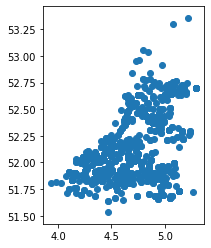

In [26]:
ndf.plot()

In [27]:
columns = ['ID_Genootschap', 'Plaats_1', 'geometry', 'ID_Gezindheid', 'ID_Type_Genootschap', 'Naam', 'Zinspreuk',
       'Oprichting', 'Opheffing', 'Info_oprichting_e.d.',
       'Legalisatie_door_Staten_van_Holland', 'Plaats_van_samenkomst',
       'Plaats_van_samenkomst_opmerking', 'Gelieerd_aan_genootschap_1',
       'Gelieerd_aan_genootschap_2', 'Gelieerd_aan_genootschap_3',
       'Breder_(institutioneel)_kader']
genootschaps = geo_plaatsnamen.merge(typed_gezinde_genootschappen)
genootschaps.columns

Index(['ID_Genootschap', 'Plaats_1', 'GeoNames_Toponiem', 'GeoNames_id',
       'GeoNames_URI', 'Latitude', 'Longitude', 'Country', 'Plaats_2',
       'Plaats_3', 'Plaats_4', 'Plaats_5', 'Plaats_opmerking', 'coordinate',
       'geometry', 'ID_Gezindheid', 'ID_Type_Genootschap', 'Naam', 'Zinspreuk',
       'Oprichting', 'Opheffing', 'Info_oprichting_e.d.',
       'Legalisatie_door_Staten_van_Holland', 'Plaats_van_samenkomst',
       'Plaats_van_samenkomst_opmerking', 'Gelieerd_aan_genootschap_1',
       'Gelieerd_aan_genootschap_2', 'Gelieerd_aan_genootschap_3',
       'Breder_(institutioneel)_kader', 'Gezindheid', 'ID_Type',
       'Type_genootschap'],
      dtype='object')

In [28]:
# there is too many columns in the file, we leave only relevant information for further processing
columns = ['ID_Genootschap', 'Plaats_1','Naam','Zinspreuk','Oprichting', 'Opheffing', 'Gezindheid', 
           'Type_genootschap', 'coordinate','geometry']
clean_genootschappen=genootschaps[columns]
clean_genootschappen.sample(5)

#n  ote: we need to do something with the 'oprichting' and 'opheffing' columns for selecting
# but leave that for later



,ID_Genootschap,Plaats_1,Naam,Zinspreuk,Oprichting,Opheffing,Gezindheid,Type_genootschap,coordinate,geometry
146,GN000178,Besoyen,Geconstitueerden,NaN,NaN,NaN,Patriots,Geconstitueerden,POINT (5.05 51.68333),POINT (5.05 51.68333)
536,GN001481,Leimuiden,Burgersociëteit,NaN,1795-02-03,1796-05-18,Bataafs (1795-1798),Politieke sociëteit,POINT (4.66944 52.22417),POINT (4.66944 52.22417)
702,GN001238,Oudorp,Burgerwapening 1785,NaN,[1785-03..1785-05],NaN,Neutraal,Schutterij 1785,POINT (4.77361 52.63333000000001),POINT (4.77361 52.63333000000001)
167,GN000155,Bodegraven,Geconstitueerden,NaN,1786-06,NaN,Patriots,Geconstitueerden,POINT (4.75 52.0825),POINT (4.75 52.0825)
84,GN001655,Amsterdam,Wijkvergadering 32,NaN,1795-03-30,NaN,Bataafs (1795-1798),Wijkvergadering (Bataafs),POINT (4.88969 52.37403),POINT (4.88969 52.37403)


In [29]:
oranjes = clean_genootschappen.query("Gezindheid == 'Oranjegezind'")
patriotten = clean_genootschappen.query("Gezindheid == 'Patriots'")
bataven = clean_genootschappen.query("Gezindheid == 'Bataafs (1795-1798)'")
neutraal = clean_genootschappen.query("Gezindheid == 'Neutraal'")


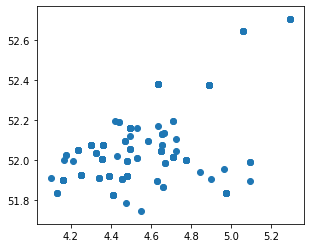

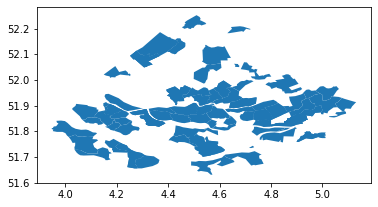

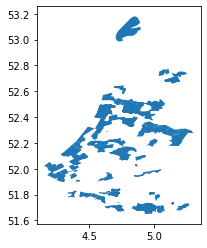

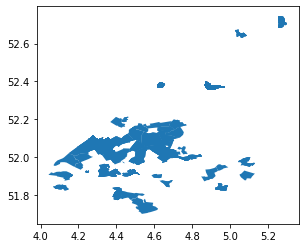

In [30]:
# and overlap between different 'gezindheden'
oranje_en_patriot = clean_genootschappen.query("Gezindheid == 'Oranjegezind' or Gezindheid == 'Patriots'")

#the above does not work (obviously)

oranje_en_patriot = pd.merge(oranjes, patriotten, left_on='Plaats_1', right_on='Plaats_1', how='inner')
oandp = oranje_en_patriot.rename(columns = {'geometry_x': 'geometry'})
oandp.plot()

# this looks fishy let's see if there are municipalities with orange societies but without patriots

patriot_places = patriotten.Plaats_1.unique()
oranje_places = oranjes.Plaats_1.unique()
oranje_no_patriot = oranjes.loc[~oranjes.Plaats_1.isin(patriot_places)]
patriot_no_oranje = patriotten.loc[~patriotten.Plaats_1.isin(oranje_places)]

ndf_oranje_only = gpd.sjoin(neth, oranje_no_patriot, how="inner")
ndf_oranje_only.plot()
ndf_patriotten_only = gpd.sjoin(neth, patriot_no_oranje, how="inner")
ndf_patriotten_only.plot()
ndf_patriot_en_oranje = gpd.sjoin(neth, oandp)
ndf_patriot_en_oranje.plot()

In [32]:
fig.savefig("patriotten_en_oranje.pdf", bbox_inches='tight')

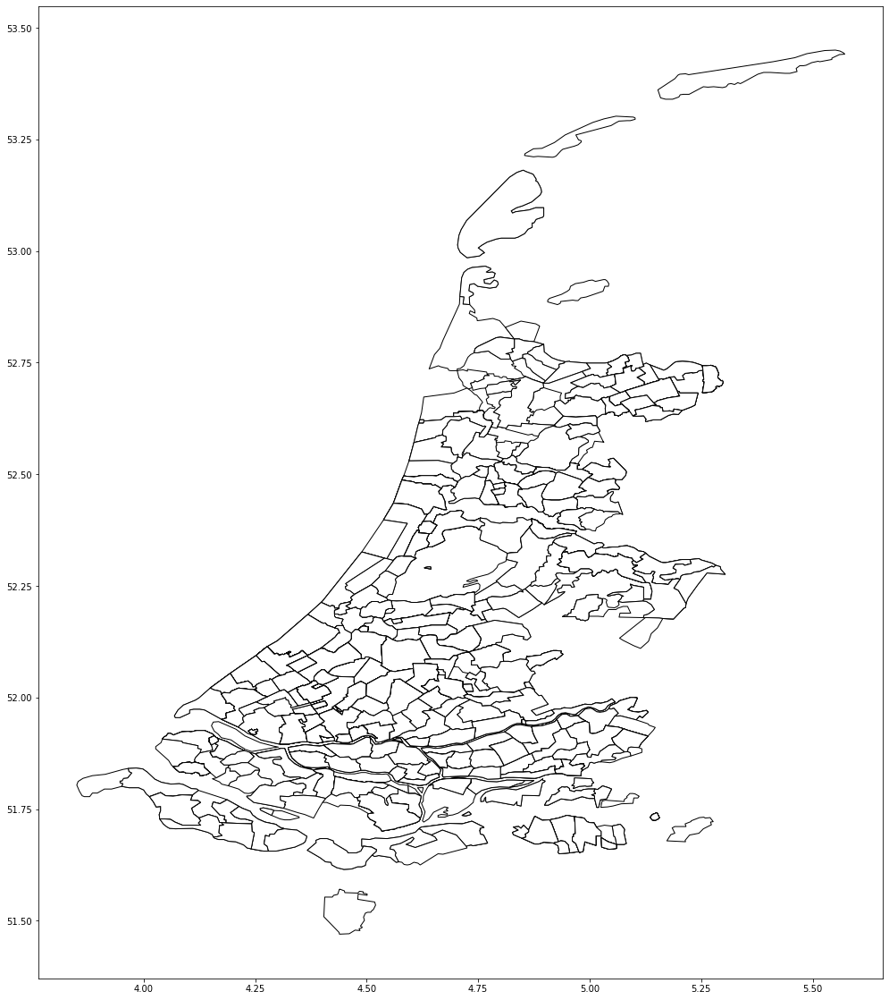

In [33]:
# join dataframes in different order gives poligons instead of points

ndf2 = gpd.sjoin(neth, geo_plaatsnamen, how="inner")
fig_ndf, ax_ndf = plt.subplots(figsize=(20,20))
ndf2.plot(color='white', edgecolor='black', ax=ax_ndf)


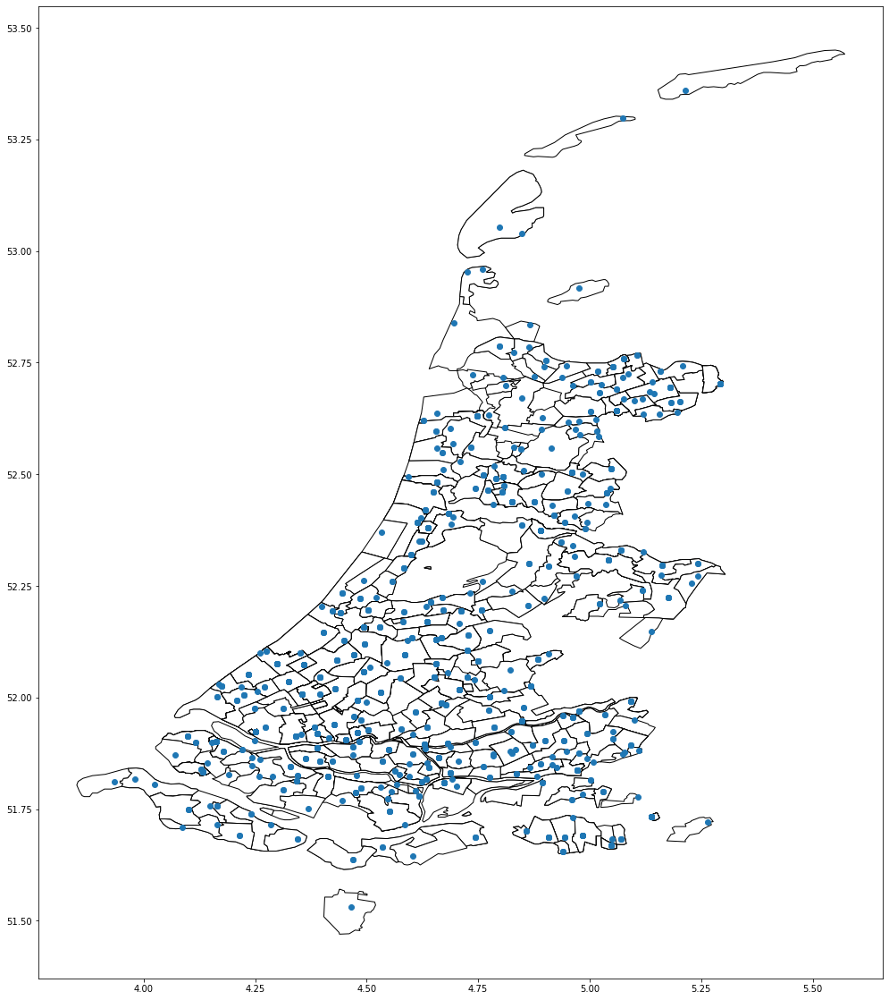

In [34]:

fig2, ax = plt.subplots(figsize=(20,20))
ndf2.plot(color='white', edgecolor='black', ax=ax)
ndf.plot(ax=ax)

In [35]:
# save image to pdf


fig2.savefig("places.pdf", bbox_inches='tight')

_N.B this does not work because the bounding box should be converted into a polygon first (see next cell)_

    bounding_box = ndf.envelope
    df = gpd.GeoDataFrame(gpd.GeoSeries(bounding_box), columns=['geometry'])

    intersections = gpd.overlay(df, neth, how='intersection')
    plt.ion()
    intersections.plot()

POINT (3.93472 51.3)


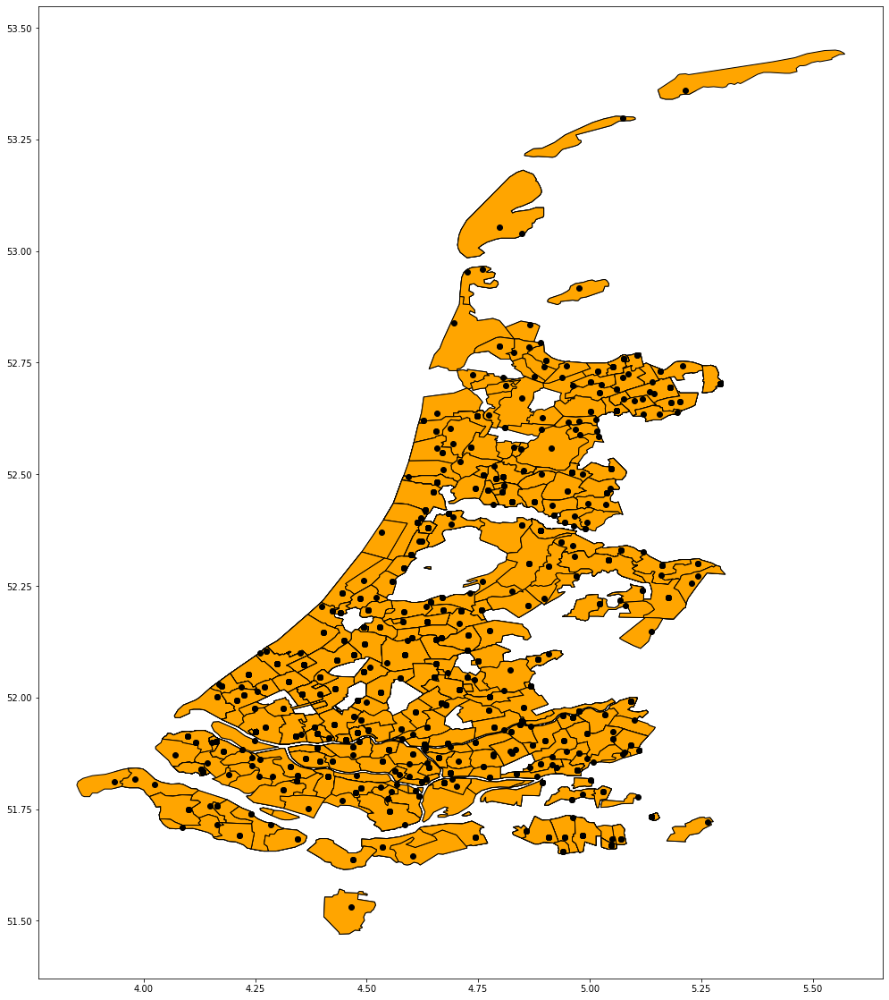

In [36]:
bbox = ndf.total_bounds

p1 = Point(bbox[0], bbox[3])
p2 = Point(bbox[2], bbox[3])
p3 = Point(bbox[2], bbox[1])
p4 = Point(bbox[0], 51.3)
print(p4)

np1 = (p1.coords.xy[0][0], p1.coords.xy[1][0])
np2 = (p2.coords.xy[0][0], p2.coords.xy[1][0])
np3 = (p3.coords.xy[0][0], p3.coords.xy[1][0])
np4 = (p4.coords.xy[0][0], p4.coords.xy[1][0])

bb_polygon = Polygon([np1, np2, np3, np4])
df2 = gpd.GeoDataFrame(gpd.GeoSeries(bb_polygon), columns=['geometry'])
df2.crs = crs
intersections = gpd.overlay(df2, ndf2, how='intersection')

fig, ax = plt.subplots(figsize=(20,20))
intersections.plot(color="white",  edgecolor='k', ax=ax)
ndf2.plot(color="orange", edgecolor="black", ax=ax) 
geo_plaatsnamen.plot(color="black", ax=ax)

In [37]:
cities = ['Dordrecht', 'Haarlem', 'Delft', 'Leiden', 'Amsterdam', 
          'Gouda', 'Rotterdam', 'Gorinchem', 'Schiedam', 'Schoonhoven', 
          'Brielle', 'Alkmaar', 'Enkhuizen', 'Hoorn', 'Medemblik', 'Edam', 
          'Monnickendam','Purmerend']
print (len(cities))
city_df = clean_genootschappen.query("Plaats_1 in {}".format(cities))
holland_cities = city_df.groupby('Plaats_1').first()
len(holland_cities.index)
set(cities).difference(set(holland_cities.index)) # see if all cities are there (should be empty)
# had to change Monnikendam to Monnickendam and Den Brielle to Brielle



18


set()

In [38]:
unique_cities = []
for item in cities:
    res = geo_plaatsnamen.loc[geo_plaatsnamen.Plaats_1 ==  item].first_valid_index()
    unique_cities.append(res)
h_cities = geo_plaatsnamen.iloc[geo_plaatsnamen.index.isin(unique_cities)]
h_cities

,ID_Genootschap,Plaats_1,GeoNames_Toponiem,GeoNames_id,GeoNames_URI,Latitude,Longitude,Country,Plaats_2,Plaats_3,Plaats_4,Plaats_5,Plaats_opmerking,coordinate,geometry
24,GN000217,Alkmaar,Alkmaar,2759899,http://sws.geonames.org/2759899/,52.63167,4.74861,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.74861 52.63166999999999),POINT (4.74861 52.63166999999999)
50,GN000032,Amsterdam,Amsterdam,2759794,http://sws.geonames.org/2759794/,52.37403,4.88969,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.88969 52.37403),POINT (4.88969 52.37403)
177,GN000026,Brielle,Brielle,2758326,http://sws.geonames.org/2758326/,51.90167,4.16250,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.1625 51.90167),POINT (4.1625 51.90167)
222,GN000019,Delft,Delft,2757345,http://sws.geonames.org/2757345/,52.00667,4.35556,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.35556 52.00667),POINT (4.35556 52.00667)
247,GN000017,Dordrecht,Dordrecht,2756669,http://sws.geonames.org/2756669/,51.81000,4.67361,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.67361 51.81),POINT (4.67361 51.81)
266,GN000211,Edam,Edam,2756431,http://sws.geonames.org/2756431/,52.51215,5.04805,NL,NaN,NaN,NaN,NaN,NaN,POINT (5.04805 52.51215),POINT (5.04805 52.51215)
276,GN000613,Enkhuizen,Enkhuizen,2756077,http://sws.geonames.org/2756077/,52.70333,5.29167,NL,NaN,NaN,NaN,NaN,NaN,POINT (5.29167 52.70333),POINT (5.29167 52.70333)
304,GN000039,Gorinchem,Gorinchem,2755434,http://sws.geonames.org/2755434/,51.83652,4.97243,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.97243 51.83652),POINT (4.97243 51.83652)
311,GN000034,Gouda,Gouda,2755420,http://sws.geonames.org/2755420/,52.01667,4.70833,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.70833 52.01667),POINT (4.70833 52.01667)
341,GN000065,Haarlem,Haarlem,2755003,http://sws.geonames.org/2755003/,52.38084,4.63683,NL,NaN,NaN,NaN,NaN,NaN,POINT (4.636830000000001 52.38084),POINT (4.636830000000001 52.38084)


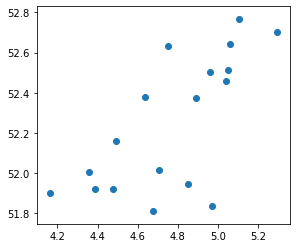

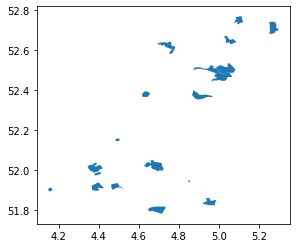

In [39]:



h_cities.plot()

# but we need areas

area_cities = gpd.sjoin(neth, h_cities, how="inner")
area_cities.plot() # better!



In [40]:
area_cities.query("GM_NAAM == 'Medemblik'")

,GM_1840,GM_NAAM,ID,CBSCODE,ACODE,geometry,index_right,ID_Genootschap,Plaats_1,GeoNames_Toponiem,...,GeoNames_URI,Latitude,Longitude,Country,Plaats_2,Plaats_3,Plaats_4,Plaats_5,Plaats_opmerking,coordinate
137,0420,Medemblik,157.0,420.0,11215.0,"POLYGON ((5.12 52.746, 5.122 52.742, 5.11 52.7...",567,GN001495,Medemblik,Medemblik,...,http://sws.geonames.org/2751073/,52.767,5.1069,NL,"52.7674° N, 5.1069° E",NaN,NaN,NaN,NaN,POINT (5.1069 52.767)


[Text(4.74861, 52.63166999999999, 'Alkmaar'),
 Text(4.88969, 52.37403, 'Amsterdam'),
 Text(4.1625, 51.90167, 'Brielle'),
 Text(4.35556, 52.00667, 'Delft'),
 Text(4.67361, 51.81, 'Dordrecht'),
 Text(5.04805, 52.51215, 'Edam'),
 Text(5.29167, 52.70333, 'Enkhuizen'),
 Text(4.97243, 51.83652, 'Gorinchem'),
 Text(4.70833, 52.01667, 'Gouda'),
 Text(4.636830000000001, 52.38084, 'Haarlem'),
 Text(5.0597199999999996, 52.6425, 'Hoorn'),
 Text(4.49306, 52.15833, 'Leiden'),
 Text(5.1069, 52.766999999999996, 'Medemblik'),
 Text(5.0375, 52.458330000000004, 'Monnickendam'),
 Text(4.95972, 52.505, 'Purmerend'),
 Text(4.47917, 51.9225, 'Rotterdam'),
 Text(4.38889, 51.91917, 'Schiedam'),
 Text(4.84861, 51.9475, 'Schoonhoven')]

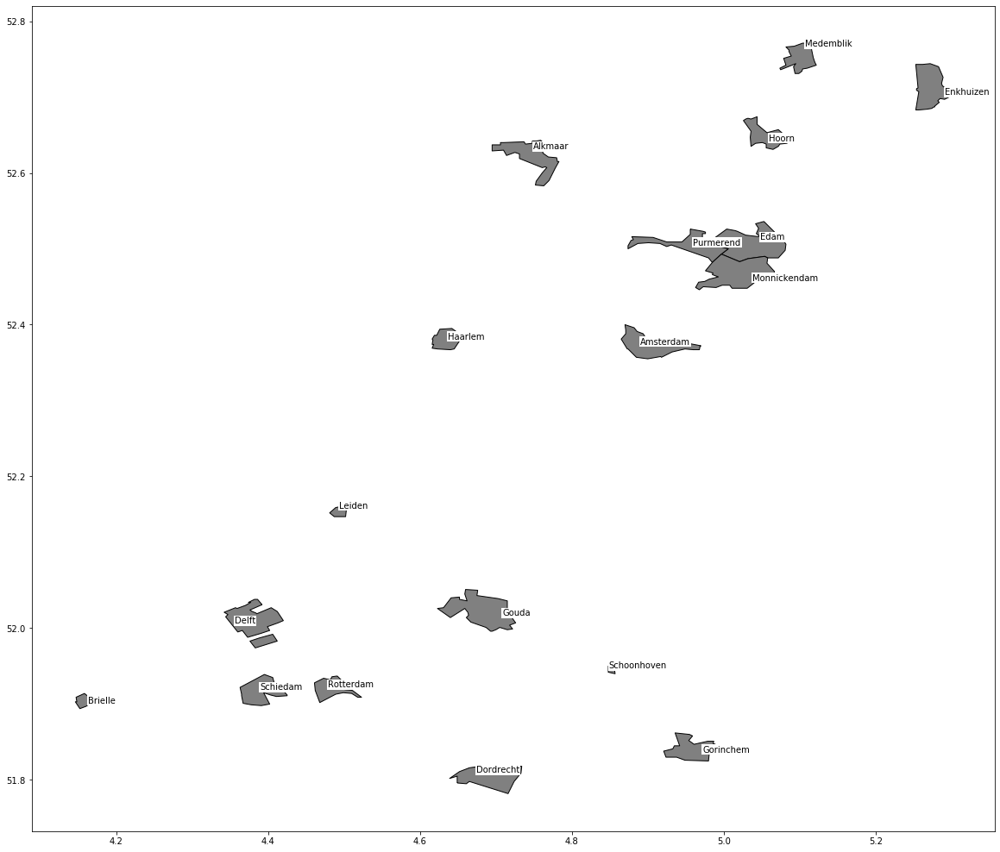

In [41]:
# and a neat city plot
fig, ax = plt.subplots(figsize=(20,20))
#ndf2.plot(color="white", edgecolor="silver", ax=ax)
area_cities.plot(color="grey", edgecolor="black", ax=ax)
# note that we have to use the place coordinates from h_cities for place names instead of the polygons from area_cities
places = h_cities.itertuples(index=True, name='Pandas') 
[plt.text(place.geometry.x, place.geometry.y, place.Plaats_1, color="black", bbox=dict(boxstyle='square,pad=0.1', fc='white', ec='none')) for place in places]

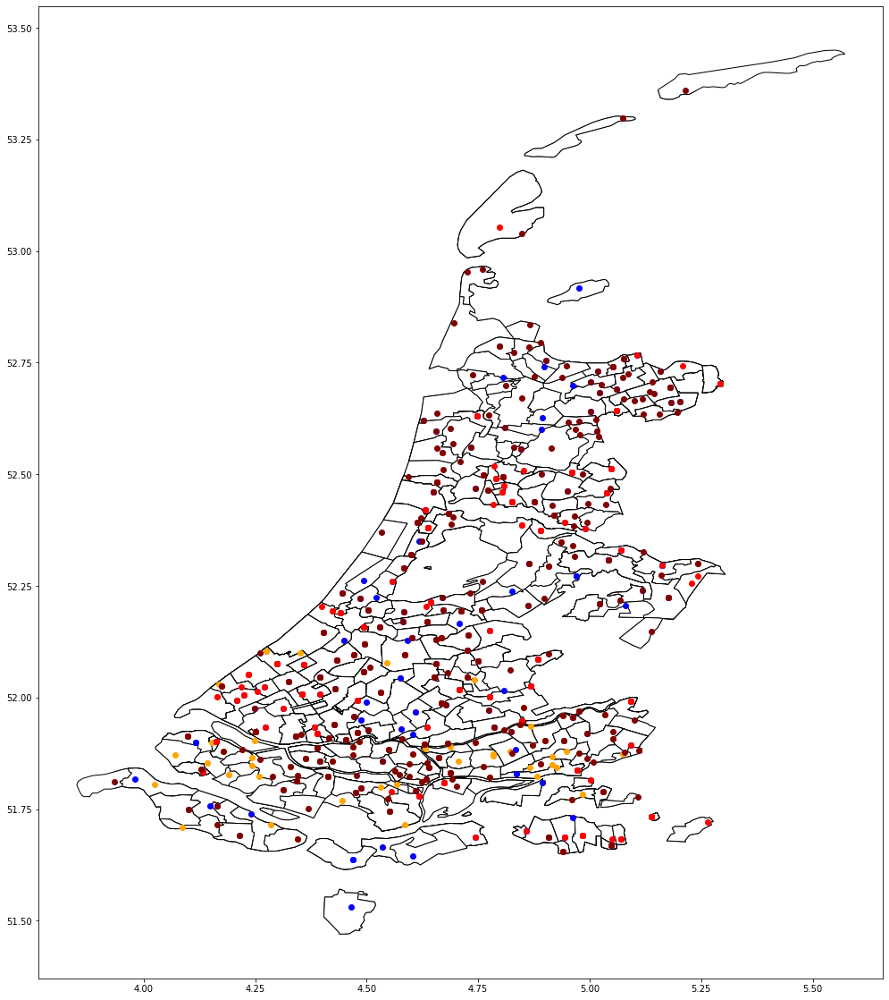

In [42]:
fig, ax = plt.subplots(figsize=(20,20))
intersections.plot(color="white",  edgecolor='k', ax=ax)
ndf2.plot(color="white", edgecolor="black", ax=ax) # we still need to get rid of the stray placecoordinates
oranjes.plot(color='orange', ax=ax)
bataven.plot(color='blue', ax=ax)
patriotten.plot(color='red', ax=ax)
neutraal.plot(color='maroon', ax=ax)


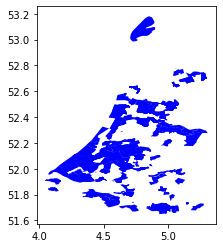

In [43]:
ndf_patriotten = gpd.sjoin(neth, patriotten, how="inner")
ndf_patriotten.plot(color='blue')

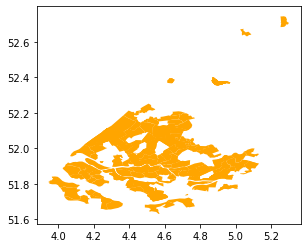

In [44]:
ndf_oranje = gpd.sjoin(neth, oranjes, how="inner")
ndf_oranje.plot(color='orange')

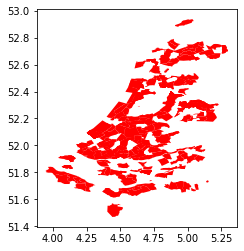

In [45]:
ndf_bataven = gpd.sjoin(neth, bataven, how="inner")
ndf_bataven.plot(color="red")

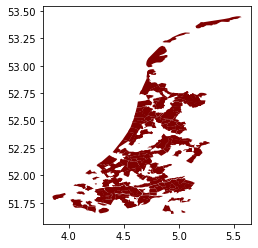

In [46]:
ndf_neutraal = gpd.sjoin(neth, neutraal, how="inner")
ndf_neutraal.plot(color="maroon")

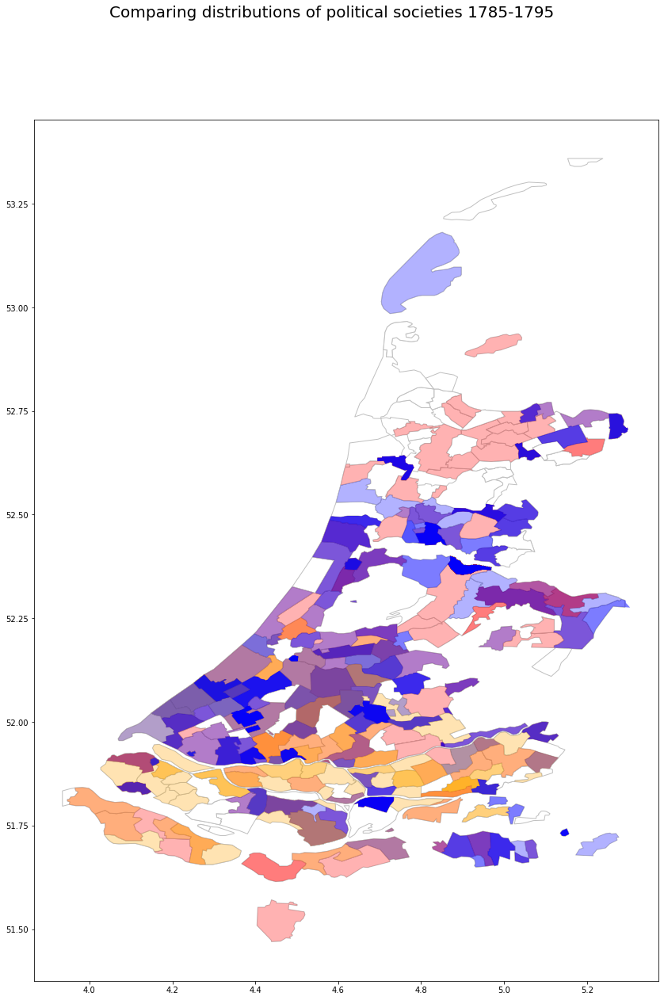

In [47]:
# plot everything together.
fig, ax = plt.subplots(figsize=(20,20))
fig.suptitle("Comparing distributions of political societies 1785-1795",fontsize=20)

intersections.plot(color="white",  edgecolor='silver', ax=ax)
#ndf_neutraal.plot(color="maroon",alpha=0.3, ax=ax)
ndf_bataven.plot(color="red", alpha=0.3, ax=ax)
ndf_oranje.plot(color="orange", alpha=0.3, ax=ax)
ndf_patriotten.plot(color="blue", alpha=0.3, ax=ax)

(3.8665059999999993, 5.367214, 51.3755445, 53.4535655)

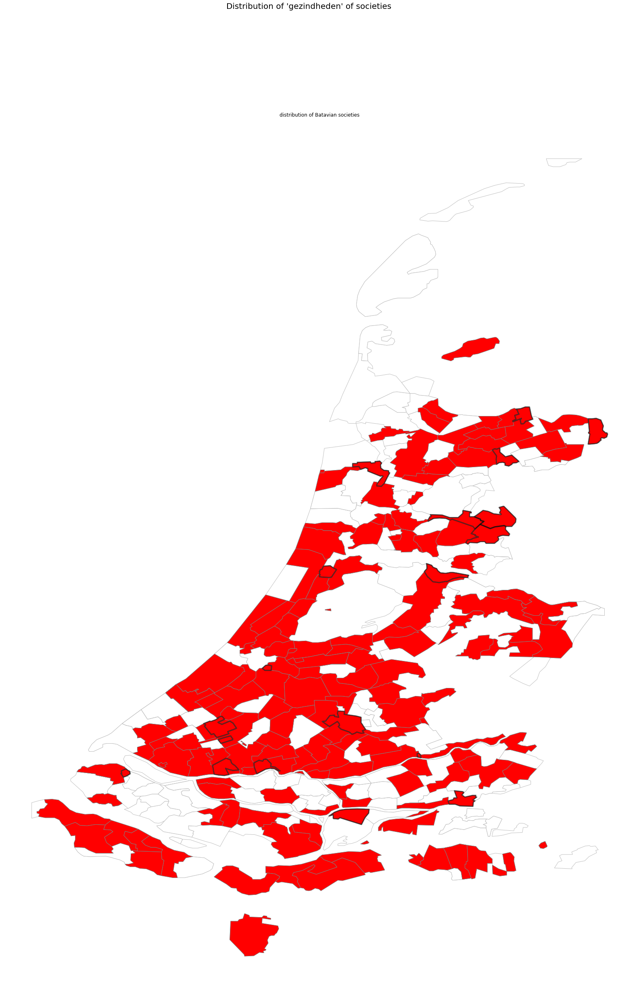

In [48]:
fig = plt.figure(figsize=(30,40))
fig.suptitle("Distribution of 'gezindheden' of societies",fontsize=20)
#ax1 = fig.add_subplot(141)
#intersections.plot(color="white",  edgecolor='k', ax=ax1)
#ax1.set_title("area of Holland")
#ax1.axis('off')

ax2 = fig.add_subplot()
intersections.plot(color="white",  edgecolor='silver', ax=ax2)
ndf_bataven.plot(color="red", edgecolor='grey', ax=ax2)
area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax2)
ax2.set_title("distribution of Batavian societies")
ax2.axis('off')

(3.763899999999999, 5.658099999999999, 51.370999999999995, 53.54900000000001)

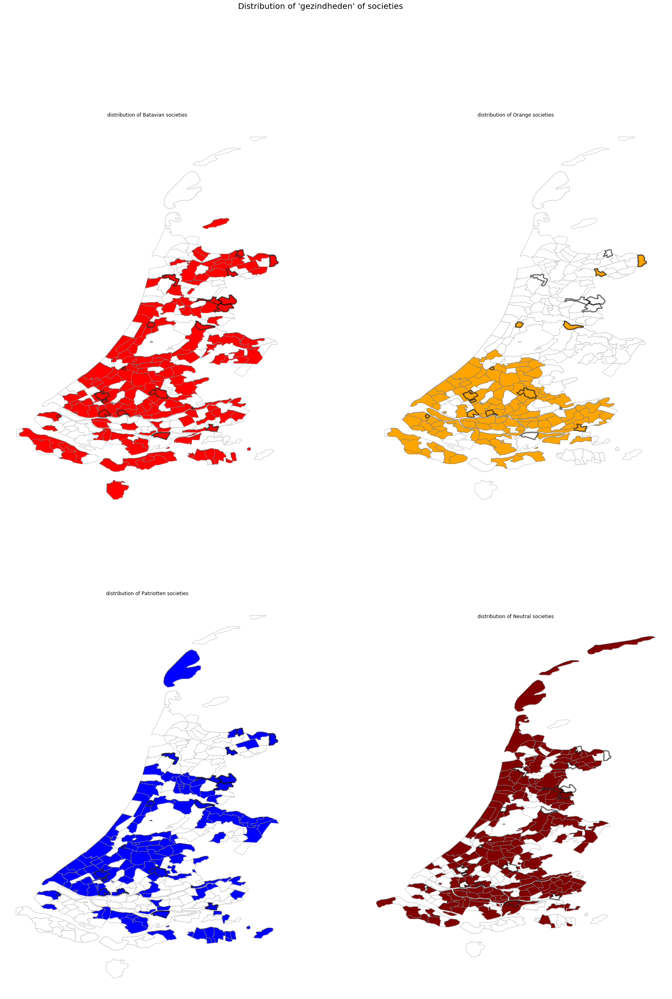

In [49]:
fig = plt.figure(figsize=(30,40))
fig.suptitle("Distribution of 'gezindheden' of societies",fontsize=20)
#ax1 = fig.add_subplot(141)
#intersections.plot(color="white",  edgecolor='k', ax=ax1)
#ax1.set_title("area of Holland")
#ax1.axis('off')

ax2 = fig.add_subplot(221)
intersections.plot(color="white",  edgecolor='silver', ax=ax2)
ndf_bataven.plot(color="red", edgecolor='grey', ax=ax2)
area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax2)
ax2.set_title("distribution of Batavian societies")
ax2.axis('off')

ax3 = fig.add_subplot(222)
intersections.plot(color="white",  edgecolor='silver', ax=ax3)
ndf_oranje.plot(color="orange", edgecolor='grey', ax=ax3)
area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax3)
ax3.set_title("distribution of Orange societies")
ax3.axis('off')

ax4 = fig.add_subplot(223)
intersections.plot(color="white",  edgecolor='silver', ax=ax4)
ndf_patriotten.plot(color="blue", edgecolor='grey', ax=ax4)
area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax4)
ax4.set_title("distribution of Patriotten societies")
ax4.axis('off')

ax5 = fig.add_subplot(224)
intersections.plot(color="white",  edgecolor='silver', ax=ax5)
ndf_neutraal.plot(color="maroon", edgecolor='grey', ax=ax5)
area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax5)
ax5.set_title("distribution of Neutral societies")
ax5.axis('off')


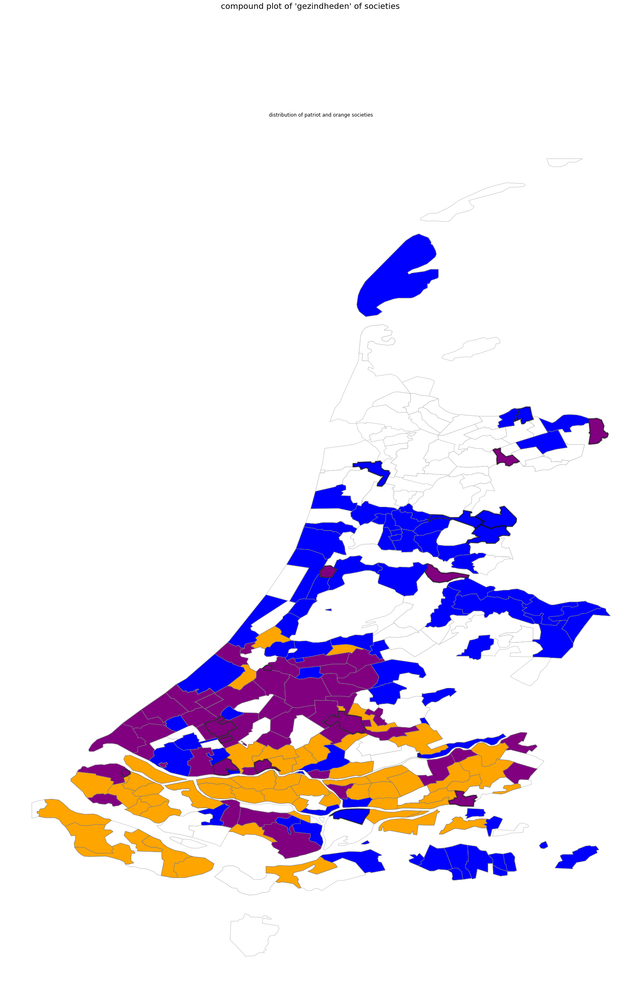

In [125]:
# lets plot this
fig = plt.figure(figsize=(30,40))
fig.suptitle("compound plot of 'gezindheden' of societies",fontsize=20)
#ax1 = fig.add_subplot(141)
#intersections.plot(color="white",  edgecolor='k', ax=ax1)
#ax1.set_title("area of Holland")
#ax1.axis('off')

ax2 = fig.add_subplot()
intersections.plot(color="white",  edgecolor='silver', ax=ax2)
ndf_oranje_only.plot(color="orange", edgecolor='grey', ax=ax2)
ndf_patriotten_only.plot(color="blue", edgecolor='grey', ax=ax2, label='patriotten')
ndf_patriot_en_oranje.plot(color="purple", edgecolor='grey', ax=ax2)
area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax2)
ax2.set_title("distribution of patriot and orange societies")
ax2.axis('off')

plt.savefig('patriotten_en_oranje.pdf')

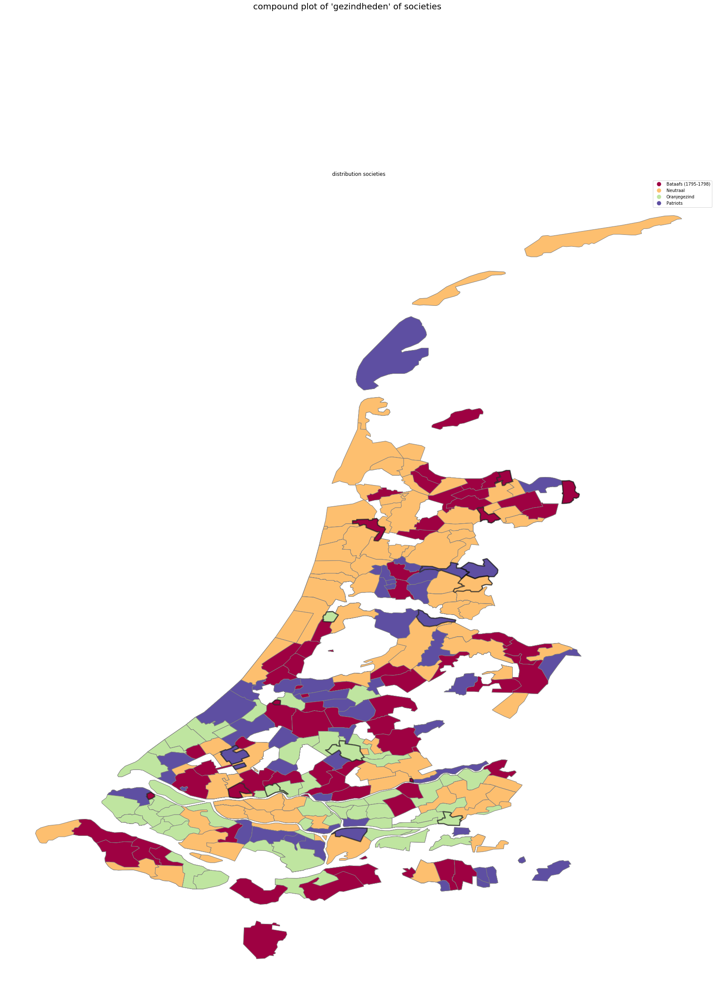

In [130]:
# lets plot a naive plot
fig = plt.figure(figsize=(30,40))
fig.suptitle("compound plot of 'gezindheden' of societies",fontsize=20)
#ax1 = fig.add_subplot(141)
#intersections.plot(color="white",  edgecolor='k', ax=ax1)
#ax1.set_title("area of Holland")
#ax1.axis('off')

ax2 = fig.add_subplot()
intersections.plot(color="white",  edgecolor='silver', ax=ax2)
gpd.sjoin(neth, clean_genootschappen, how="inner").plot(column="Gezindheid", cmap="Spectral", edgecolor='grey', ax=ax2, legend=True)
area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax2)
ax2.set_title("distribution societies")
ax2.axis('off')

plt.savefig('alles.pdf')

This looks nice, but it doesnt plot the overlaps!

### Types of societies

lets find out whether the types of societies also mean something

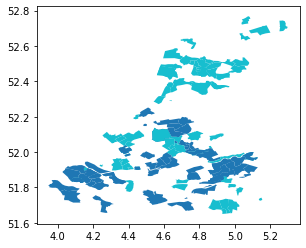

In [112]:
# Matplotlib should be able to visualize this
t_genootschap = clean_genootschappen.query("Type_genootschap == '%s'" % 'Burgers')
geo_tgenootschap = gpd.sjoin(neth, t_genootschap, how="inner")
geo_tgenootschap.plot(column='Gezindheid')

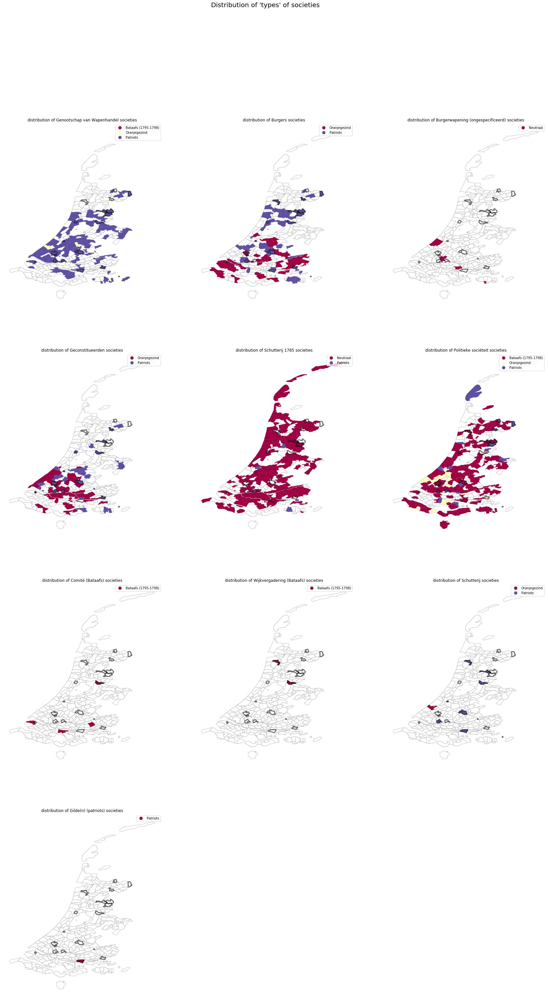

In [124]:
# and now automated
types = clean_genootschappen.Type_genootschap.unique()
fig = plt.figure(figsize=(30,50))
fig.suptitle("Distribution of 'types' of societies",fontsize=20)
colors = ['PiYG', 'PuBu', 'PuOr', 'PuRd', 'RdGy']

for t in enumerate(types):
    t_genootschap = clean_genootschappen.query("Type_genootschap == '%s'" % t[1])
    ax = fig.add_subplot(4,3,t[0]+1 )
    geo_tgenootschap = gpd.sjoin(neth, t_genootschap, how="inner")
    ndf2.plot(color="white",  edgecolor='silver', ax=ax)
    geo_tgenootschap.plot(ax=ax, column="Gezindheid", cmap='Spectral', legend=True)
    area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax)
    ax.set_title("distribution of {} societies".format(t[1]))
    ax.axis('off')

plt.savefig("test.pdf")
    

How is distribution over time? Does it matter?

And why are there some dispersed items?

We can try to normalize the types, but we need to talk about this first

In [246]:
norm = {'Schutterij 1785': ['Burgerwapening (ongespecificeerd)'],
        '':[]}
        

## Vergaderingen

In [132]:
afgevaardigden  = df.parse('1b_Afgevaardigden')
bijeenkomsten = df.parse('4_Bijeenkomsten')
vertegenw = df.parse('5a_Vertegenwoordiging')

In [133]:
afgevaardigden.head()

,Persistent_ID,ID_Genootschap,Naam,Rol_1,Rol_2,Opmerking
0,GA000001,GN000017,J. Breur,NaN,NaN,NaN
1,GA000002,GN000017,C. Dekker,NaN,NaN,NaN
2,GA000003,GN000017,Johannes Dekker junior,kapitein-commandant,NaN,NaN
3,GA000004,GN000017,F. Duffer Christoffelsz.,boekhouder,NaN,NaN
4,GA000005,GN000017,F. Duffer Claesz.,NaN,NaN,NaN


In [134]:
bijeenkomsten.head()

,ID_Vergadering,ID_Vertegenwoordiging,Datum,Plaats,Opmerking
0,VG000001,NaN,1783-08-16,Amsterdam,NaN
1,VG000002,NaN,1783-10-04,Amsterdam,NaN
2,VG000003,NaN,[1785-02-10..1785-02--12],Utrecht,NaN
3,VG000004,NaN,[1785-06-14..1785-06--16],Utrecht,NaN
4,VG000005,NaN,1785-08-01,Amsterdam,NaN


In [135]:
vertegenw.head()

,Persistent_id,ID_Genootschap,ID_Vergadering,Vertegenwoordiger,Rol_1,Rol_2,Opmerking
0,VV001355,GN000084,VG000024,P.R. Nauta Beuckens,NaN,NaN,NaN
1,VV001356,GN000084,VG000024,Jacob van Staphorst,NaN,NaN,NaN
2,VV001367,GN000556,VG000016,B. Naaktgeboren,gemeensman,NaN,NaN
3,VV001368,GN000556,VG000016,H. Pasman,kapitein,NaN,NaN
4,VV001369,GN000556,VG000016,P. de Vlaming,sergeant,NaN,NaN


In [216]:
central_places = pd.DataFrame().from_dict([["Amsterdam", 52.374, 4.88969],
 ['Utrecht', 52.090816, 5.121343],
 ['Leiden', 52.1583, 4.49306],
 ['Dordrecht', 51.81, 4.67361],
 ['Leidschendam', 52.0833, 4.43333],
 ['Delft', 52.0067, 4.35556],
 ['Hoorn (Noorderkwartier)', 52.6425, 5.05972],
 ['Den Haag', 52.0767, 4.29861],
 ['Haarlemmerhout', 52.366336, 4.623644]])

central_places.rename(columns={0:"place", 1:"latitude", 2:"longitude"}, inplace=True)
central_places

,place,latitude,longitude
0,Amsterdam,52.374000,4.889690
1,Utrecht,52.090816,5.121343
2,Leiden,52.158300,4.493060
3,Dordrecht,51.810000,4.673610
4,Leidschendam,52.083300,4.433330
5,Delft,52.006700,4.355560
6,Hoorn (Noorderkwartier),52.642500,5.059720
7,Den Haag,52.076700,4.298610
8,Haarlemmerhout,52.366336,4.623644


In [253]:
gcentral_places = gpd.GeoDataFrame(
    central_places, geometry = [Point(xy) for xy in zip(central_places.longitude,central_places.latitude)])

gcentral_places.crs = crs
gcentral_places

,place,latitude,longitude,geometry
0,Amsterdam,52.374000,4.889690,POINT (4.88969 52.374)
1,Utrecht,52.090816,5.121343,POINT (5.121343 52.090816)
2,Leiden,52.158300,4.493060,POINT (4.49306 52.1583)
3,Dordrecht,51.810000,4.673610,POINT (4.67361 51.81)
4,Leidschendam,52.083300,4.433330,POINT (4.43333 52.0833)
5,Delft,52.006700,4.355560,POINT (4.35556 52.0067)
6,Hoorn (Noorderkwartier),52.642500,5.059720,POINT (5.05972 52.6425)
7,Den Haag,52.076700,4.298610,POINT (4.29861 52.0767)
8,Haarlemmerhout,52.366336,4.623644,POINT (4.623644 52.366336)


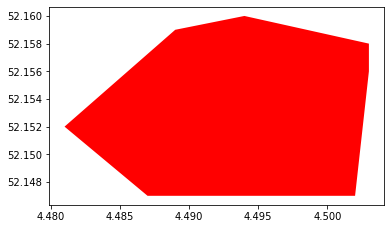

In [257]:
acentral_places = gpd.sjoin(neth, gcentral_places, how="inner")
acentral_places
cl = acentral_places.loc[acentral_places.place=='Leiden']
cl.plot(color="red")
#plt.text(gcentral_places.geometry.x, gcentral_places.geometry.y, 'Leiden', color="black", bbox=dict(boxstyle='square,pad=0.1', fc='white', ec='none'))

In [236]:
Point(cl.latitude, cl.longitude).x

52.1583

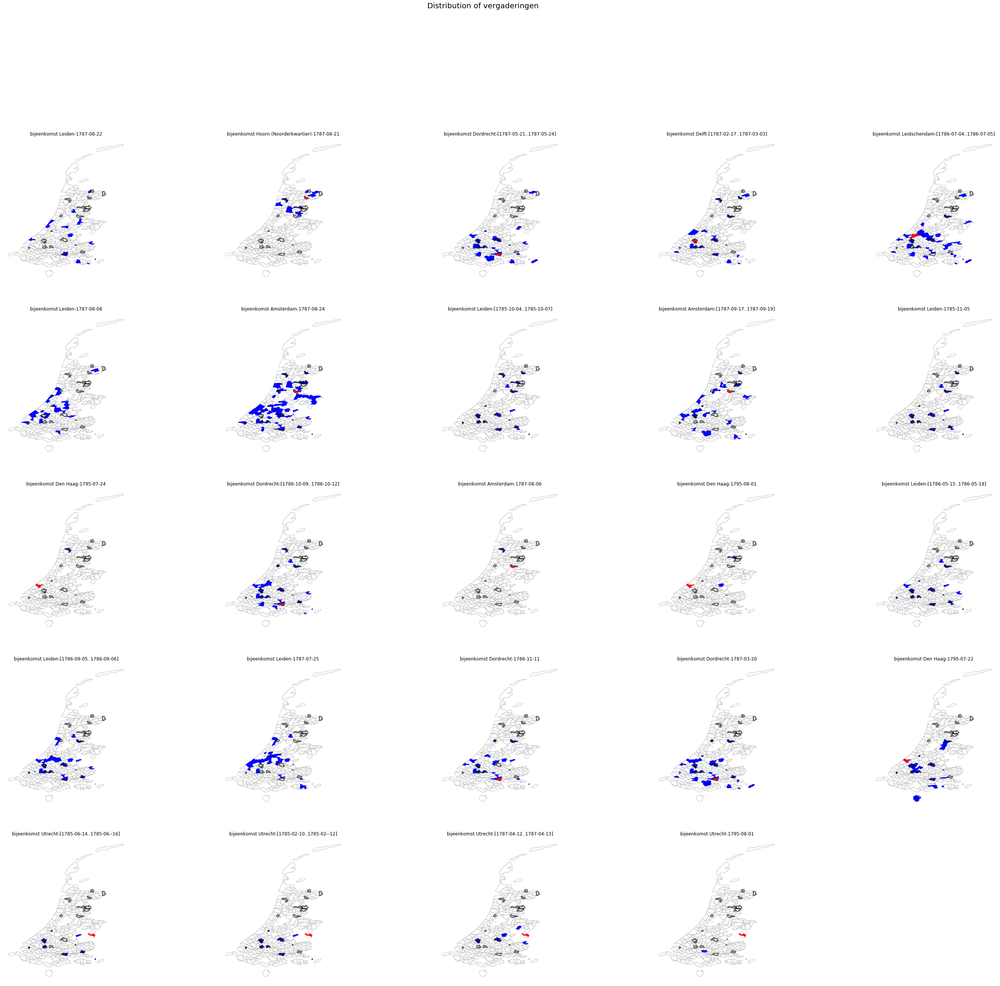

In [259]:
vert = clean_genootschappen.merge(vertegenw)
vert = vert.merge(bijeenkomsten)
vergaderingen = gpd.sjoin(neth, vert, how="inner")
gr_verg = vergaderingen['ID_Vergadering'].unique()

fig = plt.figure(figsize=(50,50))
fig.suptitle("Distribution of vergaderingen",fontsize=20)
colors = ['PiYG', 'PuBu', 'PuOr', 'PuRd', 'RdGy']
for gr in enumerate(gr_verg):
    t_verg = vergaderingen.query("ID_Vergadering == '%s'" % gr[1])
    ax = fig.add_subplot(6,5,gr[0]+1 )
    geo_tgenootschap = gpd.sjoin(neth, t_genootschap, how="inner")
    ndf2.plot(color="white",  edgecolor='silver', ax=ax)
    t_verg.plot(ax=ax, color="Blue", legend=True)
    area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=3.0, ax=ax)
    nm = t_verg.iloc[0].Plaats 
    vergn = nm + '-' + t_verg.iloc[0].Datum
    cl = acentral_places.loc[acentral_places.place==nm]
    cl.plot(color="red", ax=ax)
    pnt = Point(cl.longitude, cl.latitude)
#    plt.text(pnt.x, pnt.y, nm, color="black", bbox=dict(boxstyle='square,pad=0.1', fc='white', ec='none'))
    ax.set_title("bijeenkomst {}".format(vergn))
    ax.axis('off')
    

In [261]:
fig.savefig('bijeenkomsten.pdf')

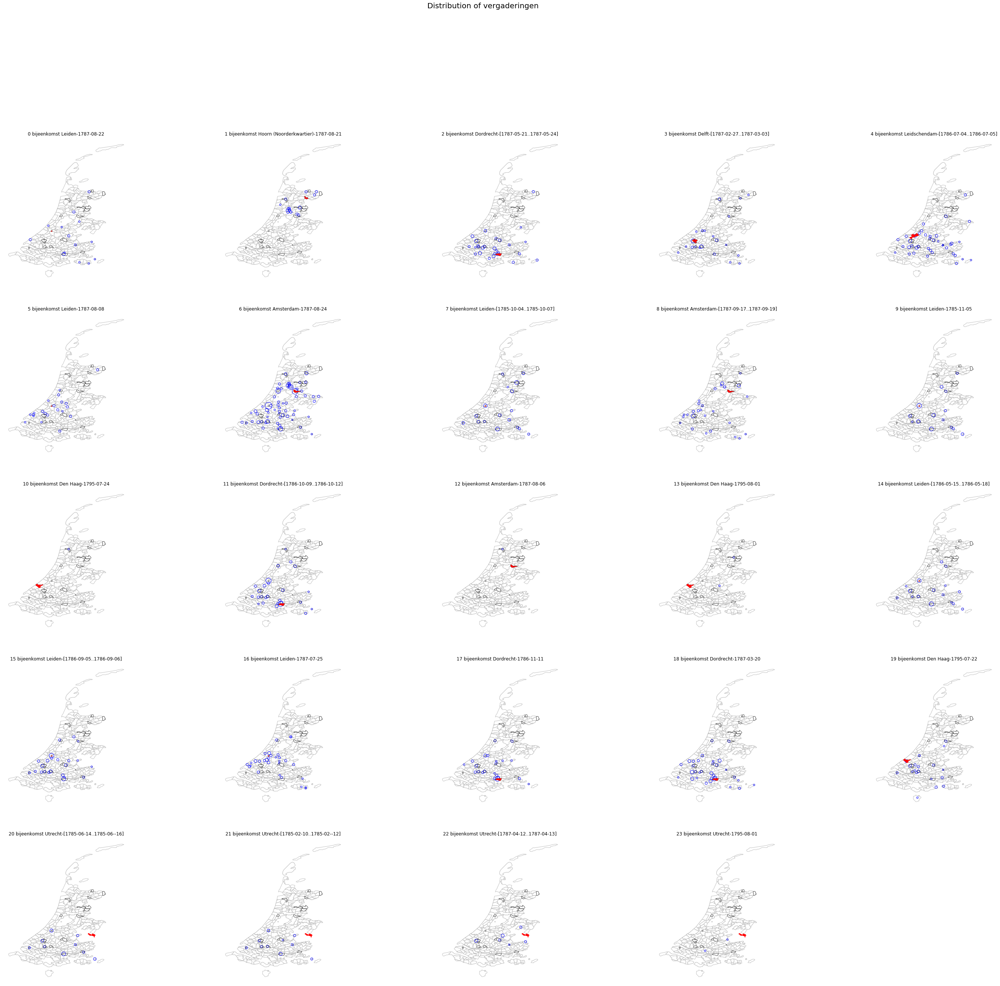

In [292]:
vert = clean_genootschappen.merge(vertegenw)
vert = vert.merge(bijeenkomsten)
vergaderingen = gpd.sjoin(neth, vert, how="inner")
gr_verg = vergaderingen['ID_Vergadering'].unique()
marker_style = dict( marker='o', facecolors='none', edgecolors='b')

fig = plt.figure(figsize=(50,50))
fig.suptitle("Distribution of vergaderingen",fontsize=20)
colors = ['PiYG', 'PuBu', 'PuOr', 'PuRd', 'RdGy']
for gr in enumerate(gr_verg):
    t_verg = vert.query("ID_Vergadering == '%s'" % gr[1])
    gv = t_verg.dissolve(by=vert.Plaats_1, aggfunc='count')
    ax = fig.add_subplot(6,5,gr[0]+1 )
    #geo_tgenootschap = gpd.sjoin(neth, t_genootschap, how="inner")
    ndf2.plot(color="white",  edgecolor='silver', ax=ax)
    gv.plot(markersize=gv.Plaats_1 * 20, ax=ax, **marker_style) 
    area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=1.0, ax=ax)
    nm = t_verg.iloc[0].Plaats 
    vergn = nm + '-' + t_verg.iloc[0].Datum
    cl = acentral_places.loc[acentral_places.place==nm]
    cl.plot(color="red", ax=ax)
    pnt = Point(cl.longitude, cl.latitude)
#    plt.text(pnt.x, pnt.y, nm, color="black", bbox=dict(boxstyle='square,pad=0.1', fc='white', ec='none'))
    ax.set_title("{} bijeenkomst {}".format(gr[0], vergn))
    ax.axis('off')
    

In [293]:
fig.savefig('bijeenkomsten+markers.pdf')

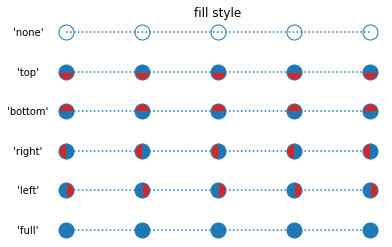

In [271]:
# see https://matplotlib.org/3.1.0/gallery/lines_bars_and_markers/marker_fillstyle_reference.html#

from matplotlib.lines import Line2D


points = np.ones(5)  # Draw 5 points for each line
marker_style = dict(color='tab:blue', linestyle=':', marker='o',
                    markersize=15, markerfacecoloralt='tab:red')

fig, ax = plt.subplots()

# Plot all fill styles.
for y, fill_style in enumerate(Line2D.fillStyles):
    ax.text(-0.5, y, repr(fill_style),
            horizontalalignment='center', verticalalignment='center')
    ax.plot(y * points, fillstyle=fill_style, **marker_style)

ax.set_axis_off()
ax.set_title('fill style')

plt.show()

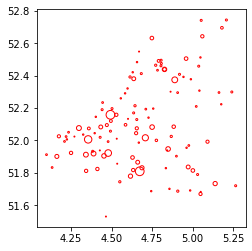

In [279]:
# from https://stackoverflow.com/questions/4143502/how-to-do-a-scatter-plot-with-empty-circles-in-python

marker_style = dict( marker='o',
                    facecolors='none', edgecolors='r')
gv.plot(color="blue", markersize=gv.Plaats_1, **marker_style) 

## Splitting dates

In [245]:
clean_genootschappen.head()

,ID_Genootschap,Plaats_1,Naam,Zinspreuk,Oprichting,Opheffing,Gezindheid,Type_genootschap,coordinate,geometry
0,GN000179,'s-Gravenmoer,Genootschap van wapenhandel,NaN,[1786-10..1786-12],[1787-03-06..],Patriots,Genootschap van Wapenhandel,POINT (4.94076 51.65594),POINT (4.94076 51.65594)
1,GN000719,'s-Gravenmoer,Burgers,NaN,1787-03,NaN,Patriots,Burgers,POINT (4.94076 51.65594),POINT (4.94076 51.65594)
2,GN001147,'s-Gravenmoer,Burgerwapening 1785,NaN,[1785-03..1785-05],NaN,Neutraal,Burgerwapening (ongespecificeerd),POINT (4.94076 51.65594),POINT (4.94076 51.65594)
3,GN000181,'s-Gravenzande,Genootschap van wapenhandel,NaN,1787,NaN,Patriots,Genootschap van Wapenhandel,POINT (4.16528 52.00167),POINT (4.16528 52.00167)
4,GN000630,'s-Gravenzande,Geconstitueerden,NaN,1787-06,NaN,Oranjegezind,Geconstitueerden,POINT (4.16528 52.00167),POINT (4.16528 52.00167)


In [311]:
import dateutil
print(dateutil.parser.parse('1786-03'))

1786-03-28 00:00:00


In [402]:


def cleanup(strng):
    if type(strng) != str:
        strng = '%s' % strng
    for item in ['[', ']', '~', '?']:
        strng = strng.replace(item, '')
    return strng

dates = clean_genootschappen.Oprichting.apply(cleanup).str.split('\.\.', expand=True).rename(columns={0:'b_start', 1:'b_end'})
#dates.b_start = dates.b_start.str.replace('~', '')
#dates.b_start = dates.b_start.str.replace('?', '')
dates.b_start = np.where((dates.b_start == ''), None, dates.b_start)
dates["begin"] = np.where((dates.b_end.isna()), dates.b_start, dates.b_end)
#dates[['b_start', 'b_end']].apply(max, axis=1)
#df['c2'] = np.where(df.c1 == 8,'X',df.c3)
dates['minbegin'] = np.where((dates.b_start <= dates.begin), dates.b_start, dates.begin)
dates['maxbegin'] = np.where((dates.begin <= dates.b_start), dates.b_start, dates.begin)
dates['maxbegin'] = dates['maxbegin'].replace('1786-11-0', '1786-11-01')
dates['maxbegin'] = pd.to_datetime(dates.maxbegin)
dates['minbegin'] = dates['minbegin'].replace('1786-11-0', '1786-11-01')
dates['minbegin'] = pd.to_datetime(dates.minbegin)

In [411]:
clean_genootschappen['minbegin'] = dates['minbegin']
clean_genootschappen


/Users/rikhoekstra/.local/share/virtualenvs/notebooks-vnr3ZyaR/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """Entry point for launching an IPython kernel.


,ID_Genootschap,Plaats_1,Naam,Zinspreuk,Oprichting,Opheffing,Gezindheid,Type_genootschap,coordinate,geometry,minbegin,maxbegin
0,GN000179,'s-Gravenmoer,Genootschap van wapenhandel,NaN,[1786-10..1786-12],[1787-03-06..],Patriots,Genootschap van Wapenhandel,POINT (4.94076 51.65594),POINT (4.94076 51.65594),1786-10-01,1786-12-01
1,GN000719,'s-Gravenmoer,Burgers,NaN,1787-03,NaN,Patriots,Burgers,POINT (4.94076 51.65594),POINT (4.94076 51.65594),1787-03-01,1787-03-01
2,GN001147,'s-Gravenmoer,Burgerwapening 1785,NaN,[1785-03..1785-05],NaN,Neutraal,Burgerwapening (ongespecificeerd),POINT (4.94076 51.65594),POINT (4.94076 51.65594),1785-03-01,1785-05-01
3,GN000181,'s-Gravenzande,Genootschap van wapenhandel,NaN,1787,NaN,Patriots,Genootschap van Wapenhandel,POINT (4.16528 52.00167),POINT (4.16528 52.00167),1787-01-01,1787-01-01
4,GN000630,'s-Gravenzande,Geconstitueerden,NaN,1787-06,NaN,Oranjegezind,Geconstitueerden,POINT (4.16528 52.00167),POINT (4.16528 52.00167),1787-06-01,1787-06-01
5,GN000914,Aalsmeer,Burgerwapening 1785,NaN,[1785-03..1785-05],NaN,Neutraal,Schutterij 1785,POINT (4.75972 52.25917),POINT (4.75972 52.25917),1785-03-01,1785-05-01
6,GN000192,Aarlanderveen,Genootschap van wapenhandel,NaN,[..1787-06],NaN,Patriots,Genootschap van Wapenhandel,POINT (4.72778 52.14083),POINT (4.72778 52.14083),1787-06-01,1787-06-01
7,GN000916,Aarlanderveen,Burgerwapening 1785,NaN,1785-02~,NaN,Neutraal,Schutterij 1785,POINT (4.72778 52.14083),POINT (4.72778 52.14083),1785-02-01,1785-02-01
8,GN001519,Aarlanderveen,Geconstitueerden,NaN,1787-07,NaN,Patriots,Geconstitueerden,POINT (4.72778 52.14083),POINT (4.72778 52.14083),1787-07-01,1787-07-01
9,GN001292,Aartswoud,Burgerwapening 1785,NaN,[1785-03..1785-05],NaN,Neutraal,Schutterij 1785,POINT (4.94861 52.74333000000001),POINT (4.94861 52.74333000000001),1785-03-01,1785-05-01


## Sequence of Oranjegezinde societies

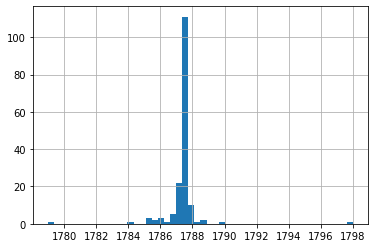

In [419]:
with_date = clean_genootschappen.loc[~clean_genootschappen.minbegin.isna()]
oranje_wd = with_date.loc[clean_genootschappen.Gezindheid == 'Oranjegezind']
oranje_wd.minbegin.hist(bins=50)

In [423]:
pd.cut(oranje_wd.minbegin, 100).value_counts()

(1787-05-12 14:24:00, 1787-07-21]             95
(1787-07-21, 1787-09-28 09:36:00]             16
(1787-03-04 04:48:00, 1787-05-12 14:24:00]    15
(1787-09-28 09:36:00, 1787-12-06 19:12:00]     8
(1786-12-24 19:12:00, 1787-03-04 04:48:00]     7
(1786-10-16 09:36:00, 1786-12-24 19:12:00]     4
(1785-04-09 04:48:00, 1785-06-17 14:24:00]     3
(1788-07-02, 1788-09-09 09:36:00]              2
(1787-12-06 19:12:00, 1788-02-14 04:48:00]     2
(1785-11-03 09:36:00, 1786-01-11 19:12:00]     2
(1788-02-14 04:48:00, 1788-04-23 14:24:00]     1
(1797-10-23 14:24:00, 1798-01-01]              1
(1789-10-30 19:12:00, 1790-01-08 04:48:00]     1
(1786-05-30 14:24:00, 1786-08-08]              1
(1786-01-11 19:12:00, 1786-03-22 04:48:00]     1
(1785-08-26, 1785-11-03 09:36:00]              1
(1785-06-17 14:24:00, 1785-08-26]              1
(1783-12-10 09:36:00, 1784-02-17 19:12:00]     1
(1786-08-08, 1786-10-16 09:36:00]              1
(1778-12-25 01:26:24, 1779-03-11 09:36:00]     1
(1794-01-04 14:24:00

In [430]:
oranje_wd.minbegin.max()

Timestamp('1798-01-01 00:00:00')

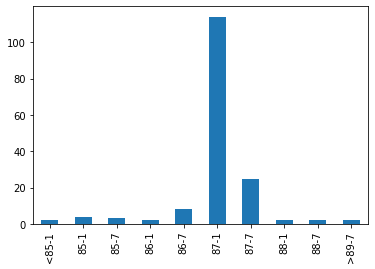

In [547]:
mbeg_cuts = [pd.datetime(1778,1,1),
             pd.datetime(1785,1,1),
             pd.datetime(1785,7,1),
             pd.datetime(1786,1,1),
             pd.datetime(1786,7,1),
             pd.datetime(1787,1,1),
             pd.datetime(1787,7,1),
             pd.datetime(1788,1,1),
             pd.datetime(1788,7,1),
             pd.datetime(1789,1,1),
             pd.datetime(1798,1,1)]
labels = ['<85-1','85-1','85-7', '86-1','86-7','87-1','87-7','88-1','88-7','>89-7']
mdates = pd.cut(oranje_wd.minbegin, mbeg_cuts, labels=labels).value_counts()
#even_cuts = [0, 200, 400, 800, 1600, 2500, even_edges.edges.max()]
#labelled = ['empty','small', 'medium-sm','medium-l','large','dense']
mdates.sort_index().plot.bar()

In [548]:
oranje_wd = oranje_wd[['Naam','Gezindheid', 'Type_genootschap', 'coordinate', 'geometry', 'minbegin']].copy(deep=True)
oranje_wd['period_orange'] = pd.cut(oranje_wd.minbegin, mbeg_cuts, labels=labels)
oranje_wd.dissolve(by='period_orange', aggfunc='count')

,geometry,Naam,Gezindheid,Type_genootschap,coordinate,minbegin
period_orange,,,,,,
<85-1,"(POINT (4.1625 51.90167), POINT (4.34583 51.68...",2,2,2,2,2
85-1,"(POINT (4.1625 51.90167), POINT (4.17917 51.87...",4,4,4,4,4
85-7,"(POINT (4.1625 51.90167), POINT (4.29861 52.07...",3,3,3,3,3
86-1,"(POINT (4.35556 52.00667), POINT (4.6555599999...",2,2,2,2,2
86-7,"(POINT (4.234690000000001 52.05073), POINT (4....",8,8,8,8,8
87-1,"(POINT (4.025 51.80583), POINT (4.07083 51.871...",114,114,114,114,114
87-7,"(POINT (4.17917 51.87917), POINT (4.27557 52.1...",25,25,25,25,25
88-1,"(POINT (4.32917 51.845), POINT (4.88969 52.374...",2,2,2,2,2
88-7,"(POINT (4.44861 52.1275), POINT (4.53194000000...",2,2,2,2,2


In [549]:
oranje_wd.period_orange.cat.categories

Index(['<85-1', '85-1', '85-7', '86-1', '86-7', '87-1', '87-7', '88-1', '88-7',
       '>89-7'],
      dtype='object')

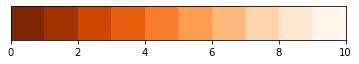

{'<85-1': (0.4980392156862745, 0.15294117647058825, 0.01568627450980392, 1.0),
 '85-1': (0.6339869281045751, 0.20522875816993463, 0.012200435729847494, 1.0),
 '85-7': (0.8065359477124183, 0.26666666666666666, 0.005664488017429193, 1.0),
 '86-1': (0.9137254901960784, 0.3686274509803921, 0.050980392156862744, 1.0),
 '86-7': (0.9712418300653595, 0.4901960784313726, 0.16383442265795206, 1.0),
 '87-1': (0.9921568627450981, 0.6104575163398693, 0.3172113289760349, 1.0),
 '87-7': (0.9921568627450981, 0.726797385620915, 0.4915032679738562, 1.0),
 '88-1': (0.9930283224400872, 0.8348583877995642, 0.6736383442265793, 1.0),
 '88-7': (0.9965141612200435, 0.9084967320261438, 0.820479302832244, 1.0),
 '>89-7': (1.0, 0.9607843137254902, 0.9215686274509803, 1.0)}

In [550]:
# colormap, from https://stackoverflow.com/questions/14720331/how-to-generate-random-colors-in-matplotlib
def get_cmap(n, name='Oranges_r'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)

def clrmap(N=0):
    N = N
    fig=plt.figure()
    ax=fig.add_subplot(111)   
    plt.axis('scaled')
    ax.set_xlim([ 0, N])
    ax.set_ylim([-0.5, 0.5])
    cmap = get_cmap(N)
    for i in range(N):
        rect = plt.Rectangle((i, -0.5), 1, 1, facecolor=cmap(i))
        ax.add_artist(rect)
    ax.set_yticks([])
    plt.show()

clrmap(N=len(oranje_wd.period_orange.cat.categories))

clrm = get_cmap(n=len(oranje_wd.period_orange.cat.categories))
clrnames = {item[1]:clrm(item[0]) for item in enumerate(oranje_wd.period_orange.cat.categories) if item!=np.nan}
clrnames


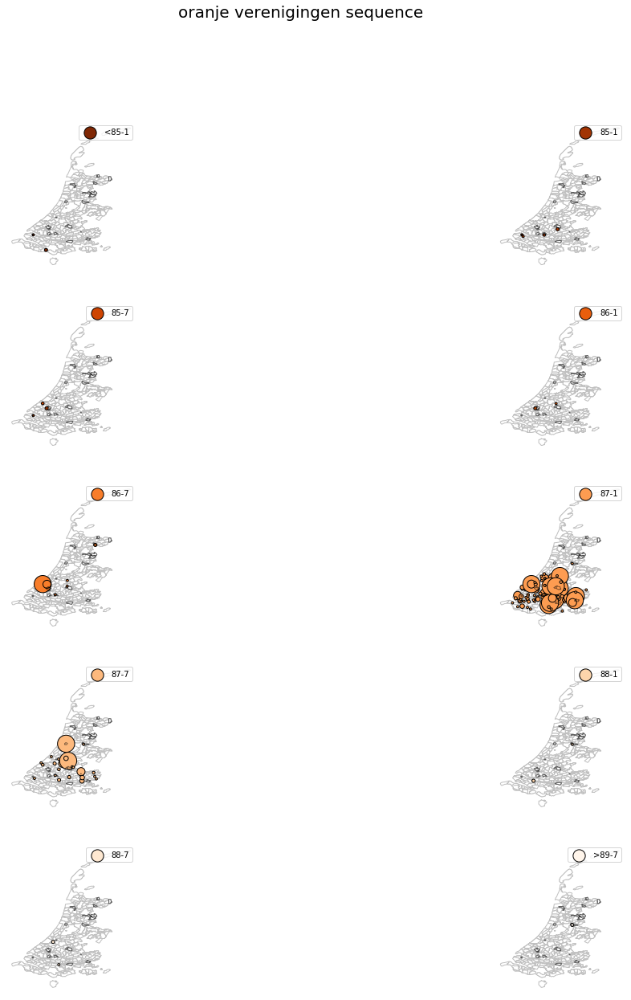

In [562]:
marker_style = dict( marker='o', facecolors='none', edgecolors='black')
fig = plt.figure(figsize=(20,20))
fig.suptitle("oranje verenigingen sequence",fontsize=20)
colors = ['PiYG', 'PuBu', 'PuOr', 'PuRd', 'RdGy']
gv = oranje_wd.dissolve(by='period_orange', aggfunc='count')
for item in enumerate(oranje_wd.period_orange.cat.categories):
    ax = fig.add_subplot(5,2,item[0]+1)
    ndf2.plot(color="white",  edgecolor='silver', ax=ax)
    if item[1] != np.nan:
        oranje_wd.loc[oranje_wd.period_orange == item[1]].plot(
                    facecolors=clrnames[item[1]],edgecolors='black', markersize=gv.Naam * 4, ax=ax, label=item[1]) # slightly inflate size of dots for better visual
        plt.legend(prop={'size':10})
    area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=1.0, ax=ax)
    ax.axis('off')

In [563]:
fig.savefig('orange_sequence.pdf')

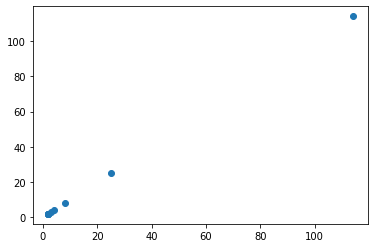

In [573]:
plt.scatter( gv.minbegin, gv.Naam,)

## Patriots

Now that there is an overview for Oranjegezinde societies, let's do the same for patriotse. This basically means repeating the whole sequence

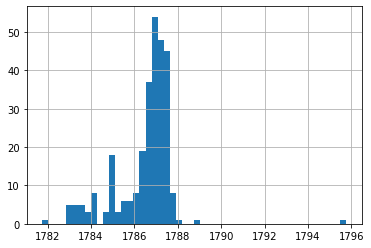

In [510]:
with_date = clean_genootschappen.loc[~clean_genootschappen.minbegin.isna()]
patriot_wd = with_date.loc[clean_genootschappen.Gezindheid == 'Patriots']
patriot_wd.minbegin.hist(bins=50)

In [511]:
pd.cut(patriot_wd.minbegin, 100).value_counts()

(1787-01-29 08:38:24, 1787-03-21 13:55:12]    36
(1787-05-11 19:12:00, 1787-07-02 00:28:48]    33
(1786-08-28 16:48:00, 1786-10-18 22:04:48]    32
(1786-10-18 22:04:48, 1786-12-09 03:21:36]    28
(1786-12-09 03:21:36, 1787-01-29 08:38:24]    26
(1784-12-22 01:26:24, 1785-02-11 06:43:12]    17
(1786-05-18 06:14:24, 1786-07-08 11:31:12]    14
(1787-07-02 00:28:48, 1787-08-22 05:45:36]    12
(1787-03-21 13:55:12, 1787-05-11 19:12:00]    12
(1787-08-22 05:45:36, 1787-10-12 11:02:24]     8
(1783-12-29 12:28:48, 1784-02-18 17:45:36]     6
(1786-07-08 11:31:12, 1786-08-28 16:48:00]     5
(1786-03-28 00:57:36, 1786-05-18 06:14:24]     5
(1783-04-17 10:04:48, 1783-06-07 15:21:36]     5
(1782-11-14 18:14:24, 1783-01-04 23:31:12]     5
(1785-10-25 09:07:12, 1785-12-15 14:24:00]     5
(1785-12-15 14:24:00, 1786-02-04 19:40:48]     5
(1785-05-24 17:16:48, 1785-07-14 22:33:36]     4
(1783-07-28 20:38:24, 1783-09-18 01:55:12]     4
(1786-02-04 19:40:48, 1786-03-28 00:57:36]     3
(1783-09-18 01:55:12

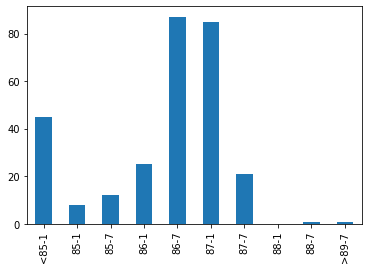

In [555]:
mbeg_cuts = [pd.datetime(1778,1,1),
             pd.datetime(1785,1,1),
             pd.datetime(1785,7,1),
             pd.datetime(1786,1,1),
             pd.datetime(1786,7,1),
             pd.datetime(1787,1,1),
             pd.datetime(1787,7,1),
             pd.datetime(1788,1,1),
             pd.datetime(1788,7,1),
             pd.datetime(1789,1,1),
             pd.datetime(1798,1,1)]
labels = ['<85-1','85-1','85-7', '86-1','86-7','87-1','87-7','88-1','88-7','>89-7']
mdates = pd.cut(patriot_wd.minbegin, mbeg_cuts, labels=labels).value_counts()
#even_cuts = [0, 200, 400, 800, 1600, 2500, even_edges.edges.max()]
#labelled = ['empty','small', 'medium-sm','medium-l','large','dense']
mdates.sort_index().plot.bar()

In [556]:
patriot_wd = patriot_wd[['Naam','Gezindheid', 'Type_genootschap', 'coordinate', 'geometry', 'minbegin']].copy(deep=True)
patriot_wd['period_patriot'] = pd.cut(patriot_wd.minbegin, mbeg_cuts, labels=labels)
patriot_wd.dissolve(by='period_patriot', aggfunc='count')

,geometry,Naam,Gezindheid,Type_genootschap,coordinate,minbegin
period_patriot,,,,,,
<85-1,"(POINT (4.1625 51.90167), POINT (4.25 51.92333...",45,45,45,45,45
85-1,"(POINT (4.34167 51.9125), POINT (4.35556 52.00...",8,8,8,8,8
85-7,"(POINT (4.44474 52.23399999999999), POINT (4.4...",12,12,12,12,12
86-1,"(POINT (4.13333 51.83333), POINT (4.29861 52.0...",25,25,25,25,25
86-7,"(POINT (4.09861 51.9125), POINT (4.13333 51.83...",87,87,87,87,87
87-1,"(POINT (4.13333 51.83333), POINT (4.2194400000...",85,85,85,85,85
87-7,"(POINT (4.25 51.92333), POINT (4.29861 52.0766...",21,21,21,21,21
88-1,None,0,0,0,0,0
88-7,POINT (4.88969 52.37403),1,1,1,1,1


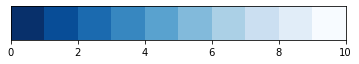

{'<85-1': (0.03137254901960784, 0.18823529411764706, 0.4196078431372549, 1.0),
 '85-1': (0.03137254901960784, 0.3032679738562091, 0.5904139433551199, 1.0),
 '85-7': (0.1076252723311547, 0.4152505446623094, 0.6880174291938999, 1.0),
 '86-1': (0.21568627450980393, 0.5294117647058824, 0.7542483660130719, 1.0),
 '86-7': (0.34814814814814815, 0.6335511982570806, 0.8113289760348584, 1.0),
 '87-1': (0.5084967320261438, 0.7311546840958606, 0.8583877995642701, 1.0),
 '87-7': (0.6718954248366014, 0.8143790849673203, 0.9006535947712418, 1.0),
 '88-1': (0.7973856209150326, 0.8727668845315903, 0.9442265795206971, 1.0),
 '88-7': (0.8814814814814815, 0.9285403050108932, 0.9721132897603486, 1.0),
 '>89-7': (0.9686274509803922, 0.984313725490196, 1.0, 1.0)}

In [557]:
# colormap, from https://stackoverflow.com/questions/14720331/how-to-generate-random-colors-in-matplotlib
def get_cmap(n, name='Blues_r'):
    '''Returns a function that maps each index in 0, 1, ..., n-1 to a distinct 
    RGB color; the keyword argument name must be a standard mpl colormap name.'''
    return plt.cm.get_cmap(name, n)

clrmap(N=len(patriot_wd.period_patriot.cat.categories))


pclrm = get_cmap(n=len(patriot_wd.period_patriot.cat.categories))
pclrnames = {item[1]:pclrm(item[0]) for item in enumerate(patriot_wd.period_patriot.cat.categories) if item!=np.nan}
pclrnames

No handles with labels found to put in legend.


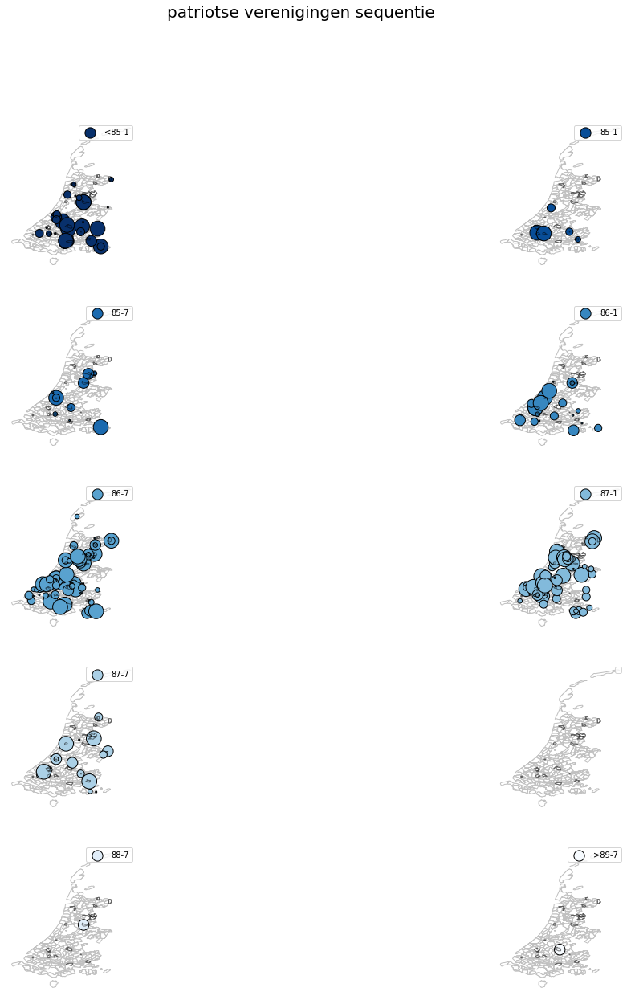

In [559]:
marker_style = dict( marker='o', facecolors='none', edgecolors='black')
fig = plt.figure(figsize=(20,20))
fig.suptitle("patriotse verenigingen sequentie",fontsize=20)
gv = patriot_wd.dissolve(by='period_patriot', aggfunc='count')
for item in enumerate(patriot_wd.period_patriot.cat.categories):
    ax = fig.add_subplot(5,2,item[0]+1)
    ndf2.plot(color="white",  edgecolor='silver', ax=ax)
    if item[1] != np.nan:
        patriot_wd.loc[patriot_wd.period_patriot == item[1]].plot(
                    facecolors=pclrnames[item[1]],edgecolors='black', markersize=gv.Naam * 4, ax=ax, label=item[1]) # slightly inflate size of dots for better visual
        plt.legend(prop={'size':10})
    area_cities.plot(color="None", edgecolor="black", alpha=0.5, lw=1.0, ax=ax)
    ax.axis('off')

In [561]:
fig.savefig('patriots_sequence.pdf')

## Spotting outlying places

The section below spots outlying places. It also contains some nice code for place name placement without overlap

In [ ]:
# determine whether outlying place are geocoded properly. But we first need an overview
southern_places = geo_plaatsnamen.query("Latitude < 51.7 or Latitude > 53 or Longitude > 5.1")

In [ ]:
geo_plaatsnamen.columns

In [ ]:
sp = southern_places[['Plaats_1', 'Latitude', 'Longitude', 'geometry', 'GeoNames_Toponiem', 'GeoNames_id',
       'GeoNames_URI']]
uplc = sp.Plaats_1.unique()
dfu = gpd.GeoDataFrame()
x = []
for item in uplc:
    res = sp.loc[sp.Plaats_1 ==  item].first_valid_index()
    x.append(res)
sp = sp.iloc[sp.index.isin(x)]


In [ ]:
# a visual overview would be nice
fig = plt.figure(figsize=(40,10))
fig.suptitle("outlying places",fontsize=20)
ax1 = fig.add_subplot(111)
intersections.plot(color="white",  edgecolor='silver', ax=ax1)
ax1.set_title("area of Holland")
ax1.axis('off')
sp.plot(ax=ax1)
places = sp.itertuples(index=True, name='Pandas')
[plt.text(place.geometry.x, place.geometry.y, place.Plaats_1, color="red", bbox=dict(boxstyle='square,pad=0.1', fc='white', ec='none')) for place in places]

In [ ]:
# but rather a visual overview without overlapping texts
from adjustText import adjust_text
from matplotlib.backends.backend_pdf import PdfPages

fig = plt.figure(figsize=(40,10))
fig.suptitle("outlying places",fontsize=20)
ax1 = fig.add_subplot(111)
intersections.plot(color="white",  edgecolor='silver', ax=ax1)
ax1.set_title("area of Holland")
ax1.axis('off')
sp.plot(ax=ax1)
places = sp.itertuples(index=True, name='Pandas')
texts = [plt.text(place.geometry.x, place.geometry.y, place.Plaats_1, color="red", bbox=dict(boxstyle='square,pad=0.1', fc='white', ec='none')) for place in places]
adjust_text(texts, arrowprops=dict(arrowstyle='->', color='grey'))
#pdf.savefig()  # saves the current figure into a pdf page   
#plt.close()

In [ ]:
# and also a table with the data 
# from https://stackoverflow.com/questions/26678467/export-a-pandas-dataframe-as-a-table-image
def render_mpl_table(data, col_width=3.0, row_height=0.625, font_size=10,
                     header_color='#40466e', row_colors=['#f1f1f2', 'w'], edge_color='w',
                     bbox=[0, 0, 1, 1], header_columns=0,
                     ax=None, **kwargs):
    if ax is None:
        size = (np.array(data.shape[::-1]) + np.array([0, 1])) * np.array([col_width, row_height])
        fig, ax = plt.subplots(figsize=size)
        ax.axis('off')

    mpl_table = ax.table(cellText=data.values, bbox=bbox, colLabels=data.columns, **kwargs)

    mpl_table.auto_set_font_size(True)
    #mpl_table.set_fontsize(font_size)

    for k, cell in  mpl_table._cells.items():
        cell.set_edgecolor(edge_color)
        if k[0] == 0 or k[1] < header_columns:
            cell.set_text_props(weight='bold', color='w')
            cell.set_facecolor(header_color)
        else:
            cell.set_facecolor(row_colors[k[0]%len(row_colors) ])
    return ax

columns = ['Plaats_1', 'GeoNames_Toponiem', 'GeoNames_id',
       'Latitude', 'Longitude', 'GeoNames_id']

x = render_mpl_table(sp[columns], header_columns=0, col_width=2.0)


In [ ]:
# save to multipage pdf using matplotlib
pdf = PdfPages('multipage_pdf.pdf')
pdf.savefig(fig)  # saves the current figure into a pdf page  
f = x.get_figure()
pdf.savefig(f)
pdf.close()



In [ ]:
import folium


In [ ]:
bbox[1] +(bbox[3]-bbox[1])/2

In [ ]:
## work this out later

# Initialize the map:
m = folium.Map(location=[4.6, 52.44], zoom_start=5)
 
# Add the color for the chloropleth:
m.choropleth(
 geo_data=state_geo,
 name='choropleth',
 data=state_data,
 columns=['State', 'Unemployment'],
 key_on='feature.id',
 fill_color='YlGn',
 fill_opacity=0.7,
 line_opacity=0.2,
 legend_name='Unemployment Rate (%)'
)
folium.LayerControl().add_to(m)
 
# Save to html
m.save('#292_folium_chloropleth_USA1.html')